#Business Problem 

Find reasons of customer churn and validate the results.

In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
  for filename in filenames:
    print(os.path.join(dirname, filename))

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
!pip install xlrd

pd.options.display.max_colwidth = 200
pd.options.display.max_rows=100
pd.options.display.max_columns=500

import warnings
warnings.filterwarnings('ignore')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
xls = pd.ExcelFile('drive/MyDrive/Datasets/E Commerce Dataset.xlsx')
retail_df = pd.read_excel(xls, 'E Comm')
retail_df.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


### Performing the Sanity Checks

In [5]:
retail_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

In [6]:
retail_df.shape

(5630, 20)

In [7]:
retail_df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustomerID,5630.0,52815.500000,1625.385339,50001.0,51408.25,52815.50,54222.7500,55630.00
Churn,5630.0,0.168384,0.374240,0.0,0.00,0.00,0.0000,1.00
Tenure,5366.0,10.189899,8.557241,0.0,2.00,9.00,16.0000,61.00
CityTier,5630.0,1.654707,0.915389,1.0,1.00,1.00,3.0000,3.00
WarehouseToHome,5379.0,15.639896,8.531475,5.0,9.00,14.00,20.0000,127.00
HourSpendOnApp,5375.0,2.931535,0.721926,0.0,2.00,3.00,3.0000,5.00
NumberOfDeviceRegistered,5630.0,3.688988,1.023999,1.0,3.00,4.00,4.0000,6.00
SatisfactionScore,5630.0,3.066785,1.380194,1.0,2.00,3.00,4.0000,5.00
NumberOfAddress,5630.0,4.214032,2.583586,1.0,2.00,3.00,6.0000,22.00
Complain,5630.0,0.284902,0.451408,0.0,0.00,0.00,1.0000,1.00


In [8]:
null_df = round(retail_df.isnull().mean()*100, 2)
null_df

CustomerID                     0.00
Churn                          0.00
Tenure                         4.69
PreferredLoginDevice           0.00
CityTier                       0.00
WarehouseToHome                4.46
PreferredPaymentMode           0.00
Gender                         0.00
HourSpendOnApp                 4.53
NumberOfDeviceRegistered       0.00
PreferedOrderCat               0.00
SatisfactionScore              0.00
MaritalStatus                  0.00
NumberOfAddress                0.00
Complain                       0.00
OrderAmountHikeFromlastYear    4.71
CouponUsed                     4.55
OrderCount                     4.58
DaySinceLastOrder              5.45
CashbackAmount                 0.00
dtype: float64

In [9]:
cat_cols = retail_df.select_dtypes(exclude=[np.number]).columns.to_list()
num_cols = retail_df.select_dtypes(include=[np.number]).columns.to_list()
cat_cols, num_cols

(['PreferredLoginDevice',
  'PreferredPaymentMode',
  'Gender',
  'PreferedOrderCat',
  'MaritalStatus'],
 ['CustomerID',
  'Churn',
  'Tenure',
  'CityTier',
  'WarehouseToHome',
  'HourSpendOnApp',
  'NumberOfDeviceRegistered',
  'SatisfactionScore',
  'NumberOfAddress',
  'Complain',
  'OrderAmountHikeFromlastYear',
  'CouponUsed',
  'OrderCount',
  'DaySinceLastOrder',
  'CashbackAmount'])

In [10]:
#Checking values in categorical columns:
for col in cat_cols:
  print(col, ': ',retail_df[col].unique())

PreferredLoginDevice :  ['Mobile Phone' 'Phone' 'Computer']
PreferredPaymentMode :  ['Debit Card' 'UPI' 'CC' 'Cash on Delivery' 'E wallet' 'COD' 'Credit Card']
Gender :  ['Female' 'Male']
PreferedOrderCat :  ['Laptop & Accessory' 'Mobile' 'Mobile Phone' 'Others' 'Fashion' 'Grocery']
MaritalStatus :  ['Single' 'Divorced' 'Married']


In [11]:
for i in retail_df.columns:
    if retail_df[i].dtypes == 'object':
        print(i)
        print()
        print('the values are:') 
        print(retail_df[i].value_counts())
        print()
        print()

PreferredLoginDevice

the values are:
Mobile Phone    2765
Computer        1634
Phone           1231
Name: PreferredLoginDevice, dtype: int64


PreferredPaymentMode

the values are:
Debit Card          2314
Credit Card         1501
E wallet             614
UPI                  414
COD                  365
CC                   273
Cash on Delivery     149
Name: PreferredPaymentMode, dtype: int64


Gender

the values are:
Male      3384
Female    2246
Name: Gender, dtype: int64


PreferedOrderCat

the values are:
Laptop & Accessory    2050
Mobile Phone          1271
Fashion                826
Mobile                 809
Grocery                410
Others                 264
Name: PreferedOrderCat, dtype: int64


MaritalStatus

the values are:
Married     2986
Single      1796
Divorced     848
Name: MaritalStatus, dtype: int64




## EDA

In [12]:
# checking categorical columns using countplot

def count_cat(df, col):
  plt.figure(figsize=[10,4])
  plt.style.use('Solarize_Light2')
  sns.countplot(data=df, x=col)
  plt.title(f'Plot of {col}')
  plt.plot()

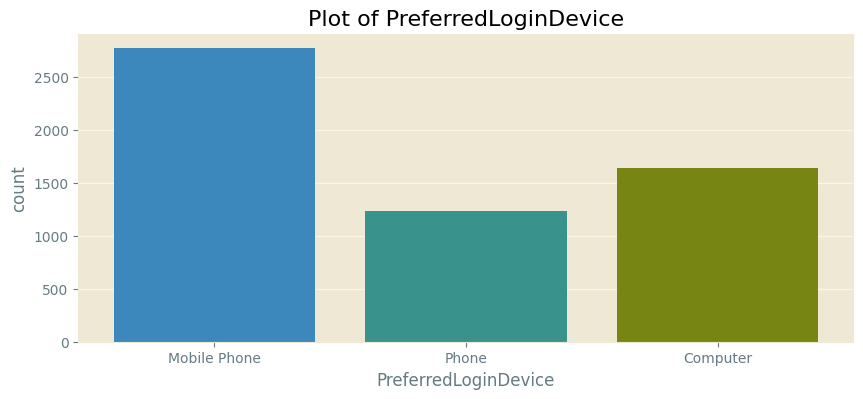

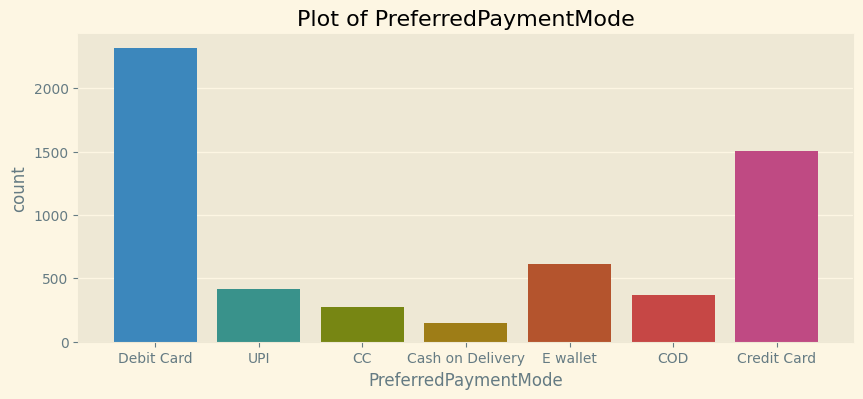

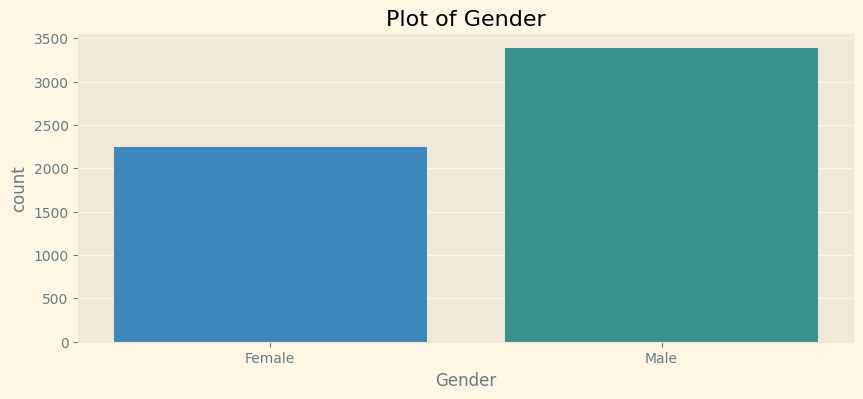

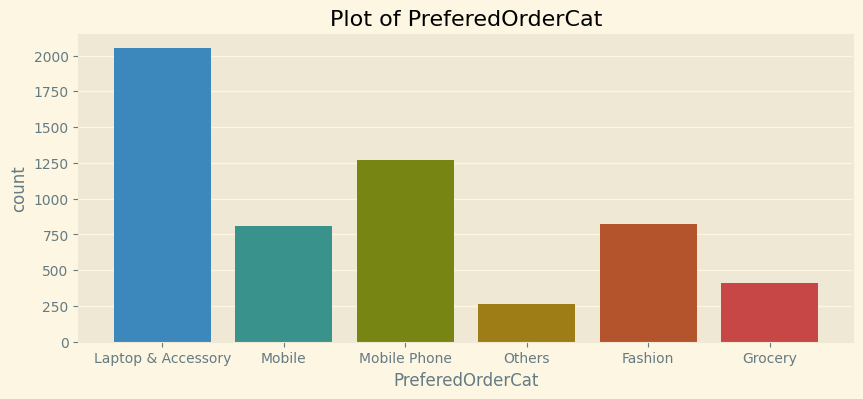

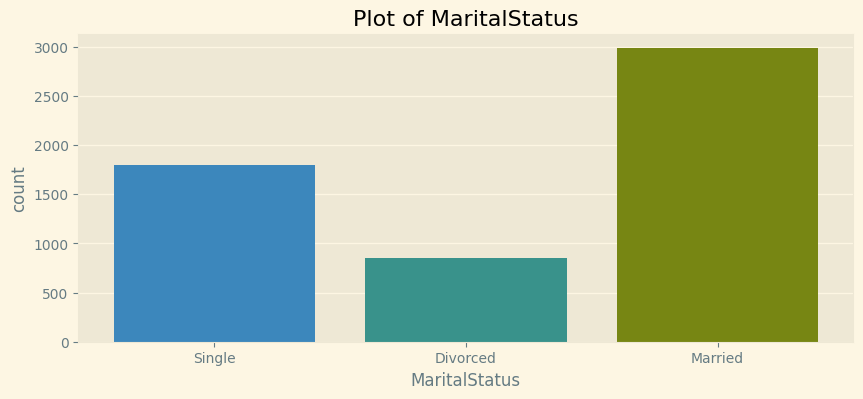

In [13]:
for col in cat_cols:
  count_cat(retail_df, col)

In [14]:
# checking categorical variables using boxplot:

def box(df, col):
    plt.figure(figsize=[12,7])
    plt.style.use('Solarize_Light2')
    
    sns.boxplot(data = df, x=col, y='Churn')
    plt.title(f'Plot of {col}')
    plt.xticks(rotation=45)
    plt.show()

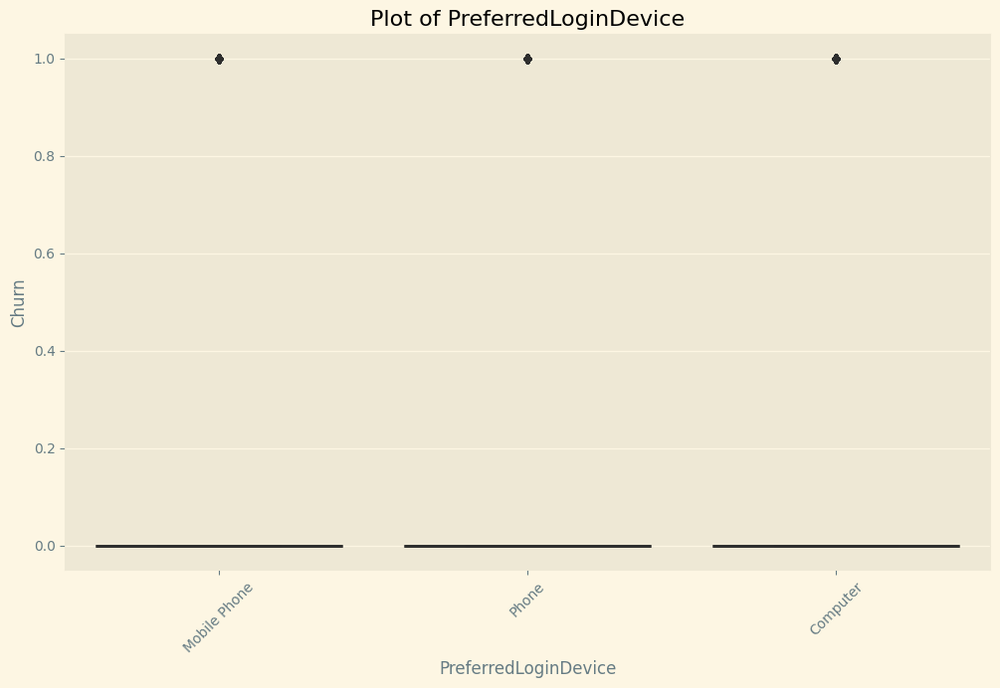

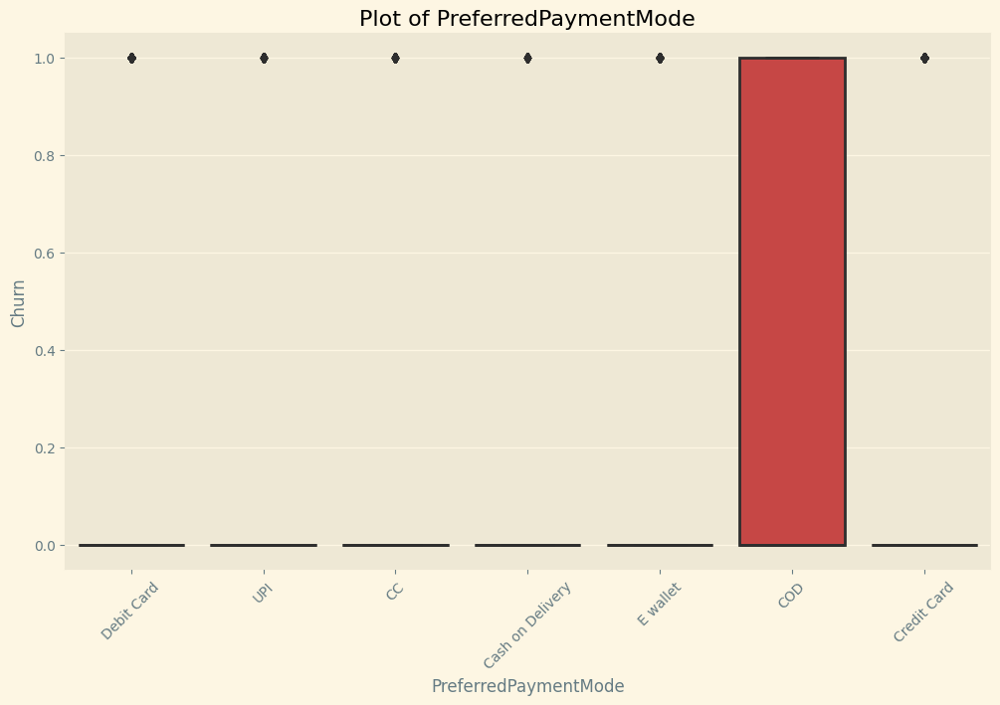

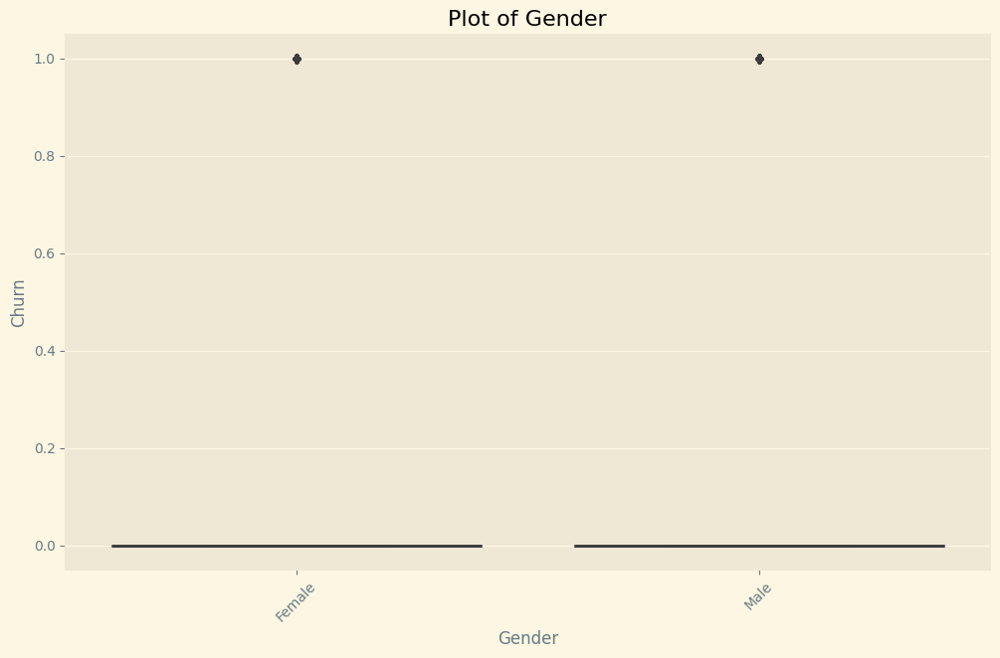

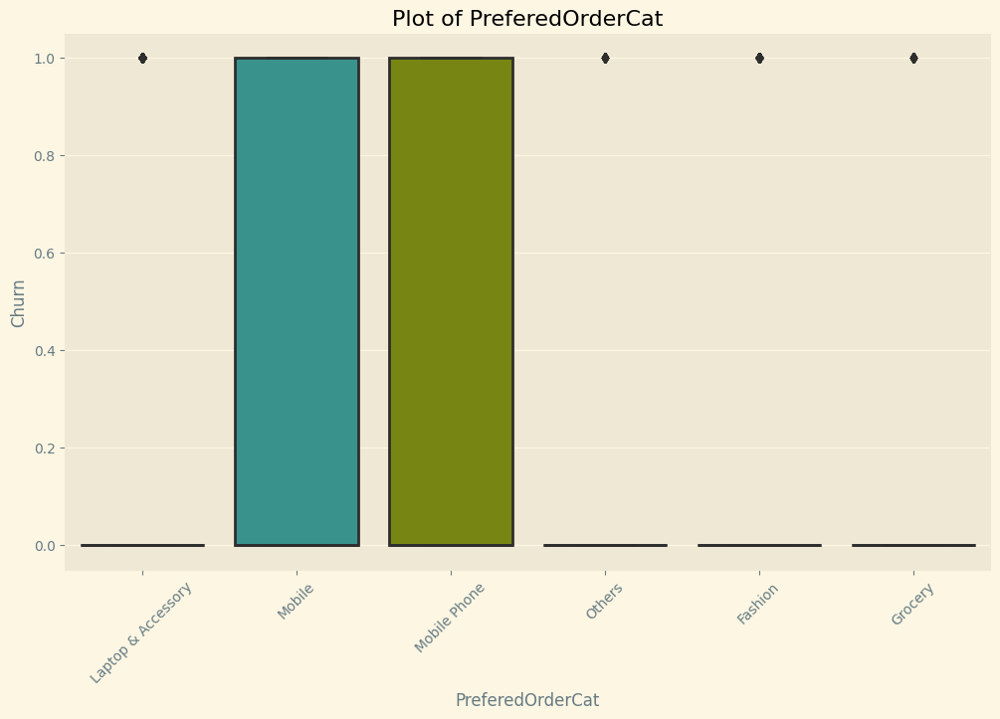

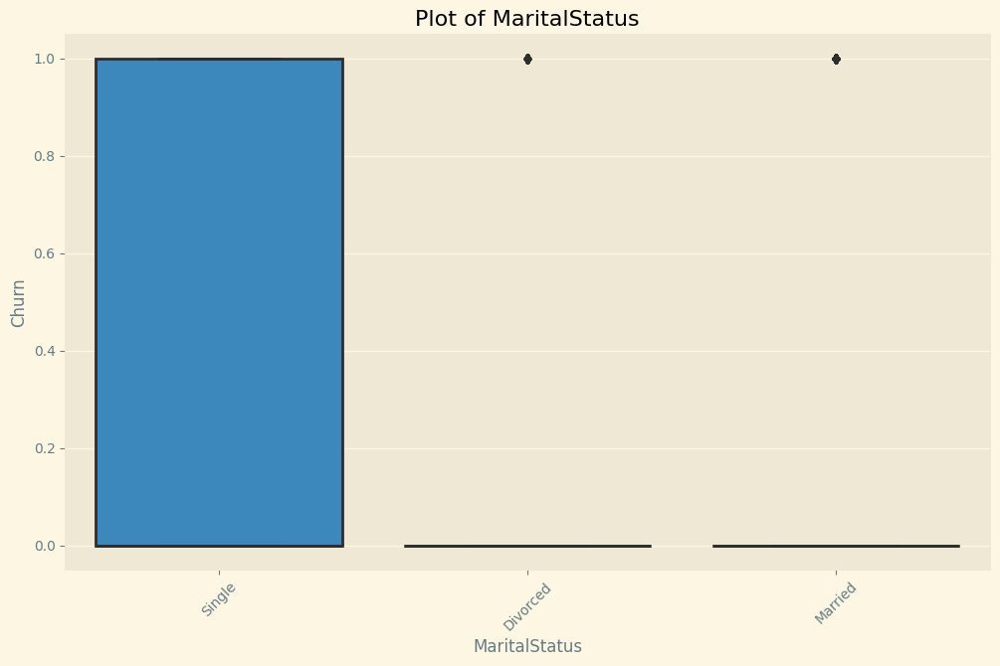

In [15]:
for c in cat_cols:
    box(retail_df, c)

### Handling the Missing Values
##### Copying the data frame into another one

In [16]:
df1 = retail_df.copy()
retail_df = retail_df.drop('CustomerID', axis=1)
retail_df.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


In [17]:
for i in retail_df.columns:
    if retail_df[i].isnull().sum() > 0:
        print(i)
        print('the total null values are:', retail_df[i].isnull().sum())
        print('the datatype is', retail_df[i].dtypes)
        print()

Tenure
the total null values are: 264
the datatype is float64

WarehouseToHome
the total null values are: 251
the datatype is float64

HourSpendOnApp
the total null values are: 255
the datatype is float64

OrderAmountHikeFromlastYear
the total null values are: 265
the datatype is float64

CouponUsed
the total null values are: 256
the datatype is float64

OrderCount
the total null values are: 258
the datatype is float64

DaySinceLastOrder
the total null values are: 307
the datatype is float64



Also converting the Churn variable to object


In [18]:
retail_df['Churn'] = retail_df['Churn'].astype('object')
retail_df['CityTier'] = retail_df['CityTier'].astype('object')


In [19]:
retail_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Tenure,5366.0,10.189899,8.557241,0.0,2.00,9.00,16.0000,61.00
WarehouseToHome,5379.0,15.639896,8.531475,5.0,9.00,14.00,20.0000,127.00
HourSpendOnApp,5375.0,2.931535,0.721926,0.0,2.00,3.00,3.0000,5.00
NumberOfDeviceRegistered,5630.0,3.688988,1.023999,1.0,3.00,4.00,4.0000,6.00
SatisfactionScore,5630.0,3.066785,1.380194,1.0,2.00,3.00,4.0000,5.00
NumberOfAddress,5630.0,4.214032,2.583586,1.0,2.00,3.00,6.0000,22.00
Complain,5630.0,0.284902,0.451408,0.0,0.00,0.00,1.0000,1.00
OrderAmountHikeFromlastYear,5365.0,15.707922,3.675485,11.0,13.00,15.00,18.0000,26.00
CouponUsed,5374.0,1.751023,1.894621,0.0,1.00,1.00,2.0000,16.00
OrderCount,5372.0,3.008004,2.939680,1.0,1.00,2.00,3.0000,16.00


First lets go about filling the missing values by the median values -> Mean and median values are very close for all the above variables hence we will prefer filling the median values.



In [20]:
for i in retail_df.columns:
  if retail_df[i].isnull().sum()>0:
    retail_df[i].fillna(retail_df[i].median(), inplace=True)
    

## Outlier Treatment
We will now treat outliers. For this we will define the lower range and upper range which is going to be at a distnace of 1.5 times the Interquartile range from the respective whiskers

Text(0, 0.5, 'Values')

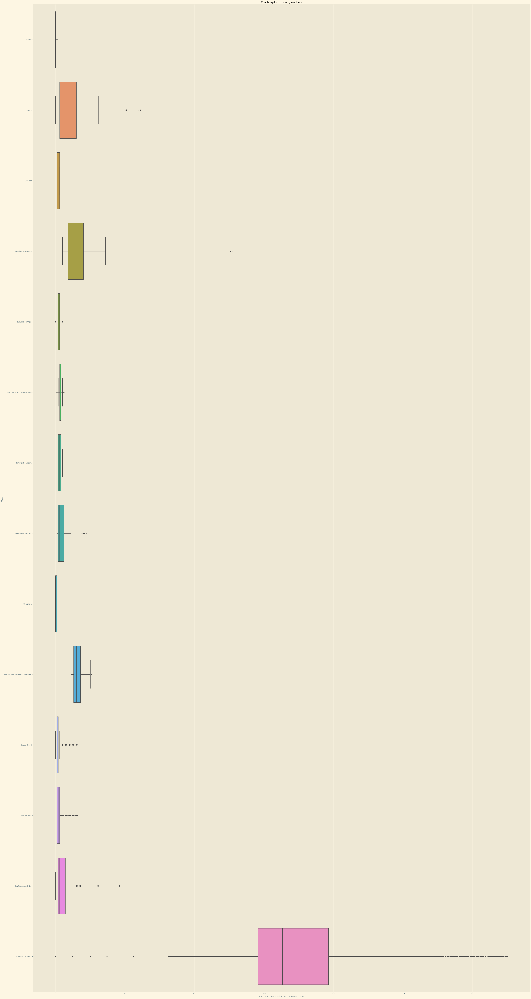

In [21]:
plt.figure(figsize=(50,100))
sns.boxplot(data=retail_df, orient='h')
plt.title('The boxplot to study outliers')
plt.xlabel('Variables that predict the customer churn')
plt.ylabel('Values')

We will now treat outliers. For this we will define the lower range and upper range which is going to be at a distnace of 1.5 times the Interquartile range from the respective whiskers

In [22]:
def remove_outlier(col):
  sorted(col)
  Q1,Q3 = np.percentile(col, [25,75])
  IQR = Q3-Q1
  lr = Q1-(1.5*IQR)
  ur = Q3+(1.5*IQR)
  return lr,ur

In [23]:
for col in retail_df.columns:
    if retail_df[col].dtype != 'object': 
        lr,ur=remove_outlier(retail_df[col])
        retail_df[col]=np.where(retail_df[col]>ur,ur,retail_df[col])
        retail_df[col]=np.where(retail_df[col]<lr,lr,retail_df[col])

Text(0, 0.5, 'Values')

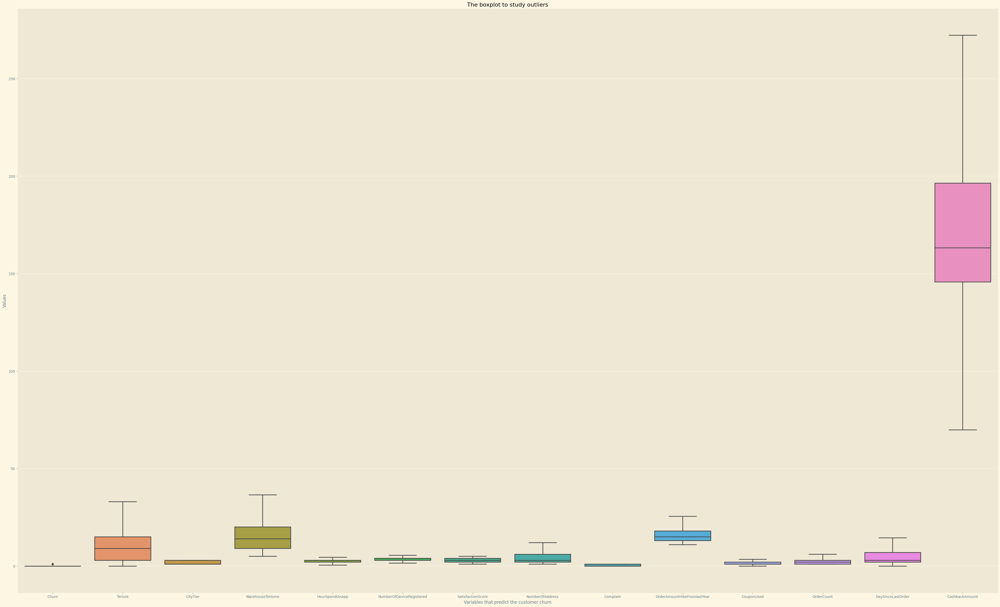

In [24]:
plt.figure(figsize=(50,30))
sns.boxplot(data=retail_df)
plt.title('The boxplot to study outliers')
plt.xlabel('Variables that predict the customer churn')
plt.ylabel('Values')

Here we can see that we have treated all the outliers. The outliers are now replaced with their corresponding upper range or lower range values



### Feature Engineering - Adding new variables¶


In [25]:
retail_df.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3.0,Laptop & Accessory,2.0,Single,9.0,1.0,11.0,1.0,1.0,5.0,159.93
1,1,9.0,Phone,1,8.0,UPI,Male,3.0,4.0,Mobile,3.0,Single,7.0,1.0,15.0,0.0,1.0,0.0,120.90
2,1,9.0,Phone,1,30.0,Debit Card,Male,2.0,4.0,Mobile,3.0,Single,6.0,1.0,14.0,0.0,1.0,3.0,120.28
3,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4.0,Laptop & Accessory,5.0,Single,8.0,0.0,23.0,0.0,1.0,3.0,134.07
4,1,0.0,Phone,1,12.0,CC,Male,3.0,3.0,Mobile,5.0,Single,3.0,0.0,11.0,1.0,1.0,3.0,129.60


In [26]:
#Average Cashback per order

retail_df['avg_cashbk_per_order'] = retail_df['CashbackAmount'] / retail_df['OrderCount']


In [27]:
#Percentage of Customer Churn
Churn_perc = round((retail_df['Churn'][retail_df['Churn']==1].count()*100/retail_df['Churn'][retail_df['Churn']==0].count()),2)
print('The average customer churn is:', Churn_perc,'%')


The average customer churn is: 20.25 %


In [28]:
# defining a tuple for storing the dataframes in a containing information about the contribution each value to the customer churn.
# this was done so that we can quickly automate making such dataframes

d={}

# running loop for storing the calculating and storing the values in the relevant dataframes  

for i in retail_df.columns:
  d[i] = pd.concat([retail_df.groupby(i).Churn.sum(),retail_df[i].value_counts(),retail_df.groupby(i).Churn.sum()*100/retail_df[i].value_counts()], axis=1)
  d[i].reset_index(level=0,inplace=True)
  d[i] = d[i].rename(columns = {'index':i, 'Churn':'Customers_churned', i:'Total_Customers', 0:'perc_of_total_cust'}, )

In [29]:
for i in retail_df.columns:
    print(i)
    print(d[i])
    print()

Churn
   Churn Total_Customers Total_Customers Total_Customers
0      0               0            4682             0.0
1      1             948             948           100.0

Tenure
    Tenure Customers_churned  Total_Customers perc_of_total_cust
0      0.0               272              508          53.543307
1      1.0               349              690           50.57971
2      2.0                14              167           8.383234
3      3.0                18              195           9.230769
4      4.0                20              203           9.852217
5      5.0                16              204           7.843137
6      6.0                 8              183           4.371585
7      7.0                16              221           7.239819
8      8.0                16              263            6.08365
9      9.0                93              511          18.199609
10    10.0                14              213            6.57277
11    11.0                10       

#### Analysing the Churn by each Variable - Visualising via Graphs

In [30]:
def analysis_chart(variable):
  # definig the plot for matplotlib
  plt.figure(figsize=(20,12))
  fig, ax = plt.subplots()
  # defining the title
  title1 = 'Customers Churn analysed by ' + variable
  plt.title(title1)
  # defining the lines for the y-axis
  line1 = ax.plot(d[variable][variable], d[variable]['Customers_churned'], color='lightskyblue', label = 'Customers churned')
  line2 = ax.plot(d[variable][variable], d[variable]['Total_Customers'], color='dodgerblue', label = 'Total Customers')
  # labelling the x -axis and y-axis
  plt.xlabel (variable)
  plt.ylabel ('No. of customers')
  # rotating the labels on the x-axis for better visualisation
  for tick in ax.get_xticklabels():
    tick.set_rotation(45)
  # defining another axis on the right side of the graph
  ax2=ax.twinx()
  # defining the line for the right side y-axis
  line3 = ax2.plot(d[variable][variable],d[variable]['perc_of_total_cust'], color='yellowgreen', label = 'Churn as Percent of total')
  y = 0*d[variable]['perc_of_total_cust']+20.25
  line4 = ax2.plot(d[variable][variable], y, color='orangered', label='Average customer Churn', linestyle='dashed')
  # labelling the right side y-axis
  plt.ylabel ('percentage of customers churned')
  # adding the three lines to show the legend on the right corner in a coherent place, not doing this will lead to overlapping of legends of lines belonging to left and right y axis
  lines = line1+line2+line3+line4
  labs = [l.get_label() for l in lines]
  ax.legend(lines, labs, bbox_to_anchor=(1.7, 1))
  # adding sns palette for better visualisation
  sns.despine(ax=ax, right=True, left=True)
  sns.despine(ax=ax2, left=True, right=False)

<Figure size 2000x1200 with 0 Axes>

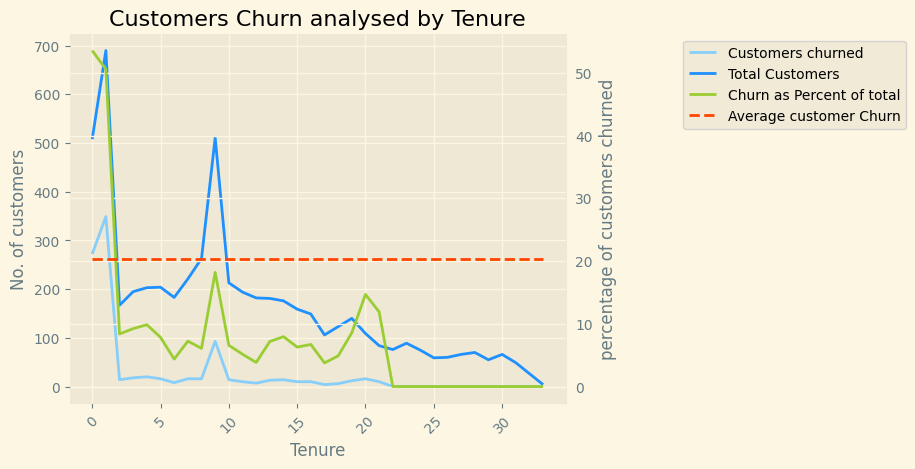

<Figure size 2000x1200 with 0 Axes>

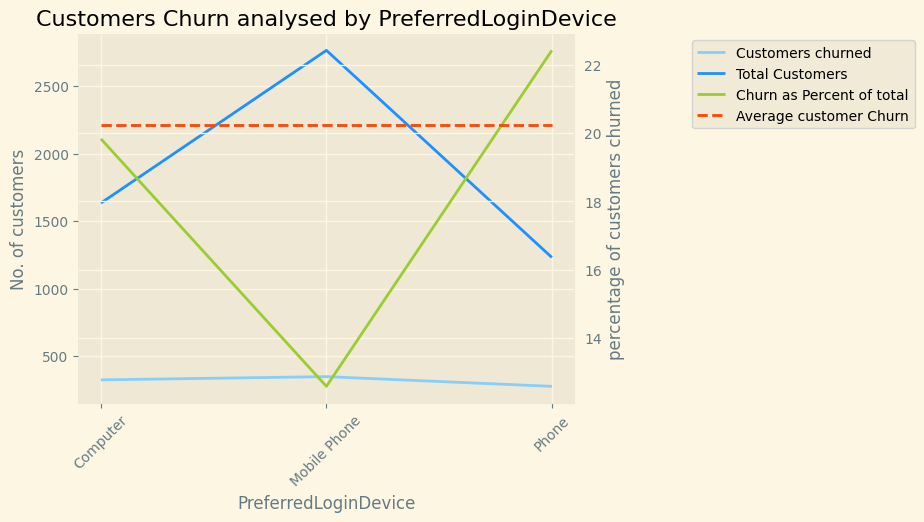

<Figure size 2000x1200 with 0 Axes>

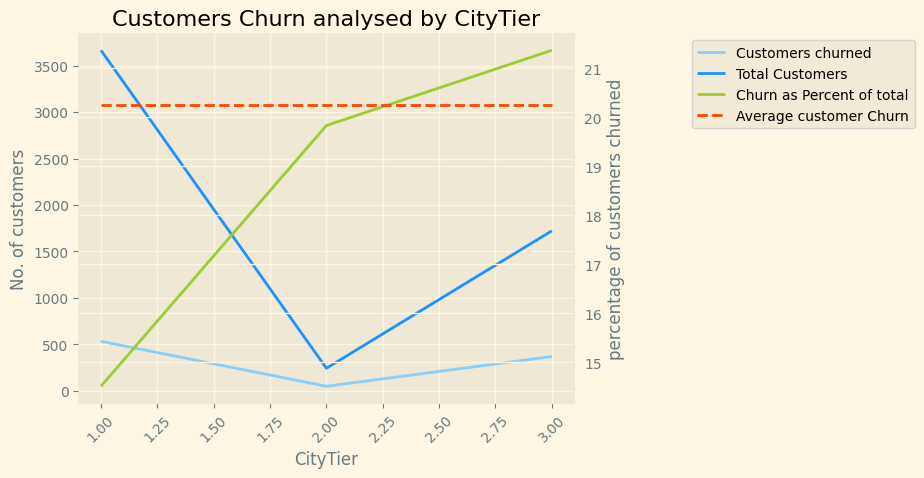

<Figure size 2000x1200 with 0 Axes>

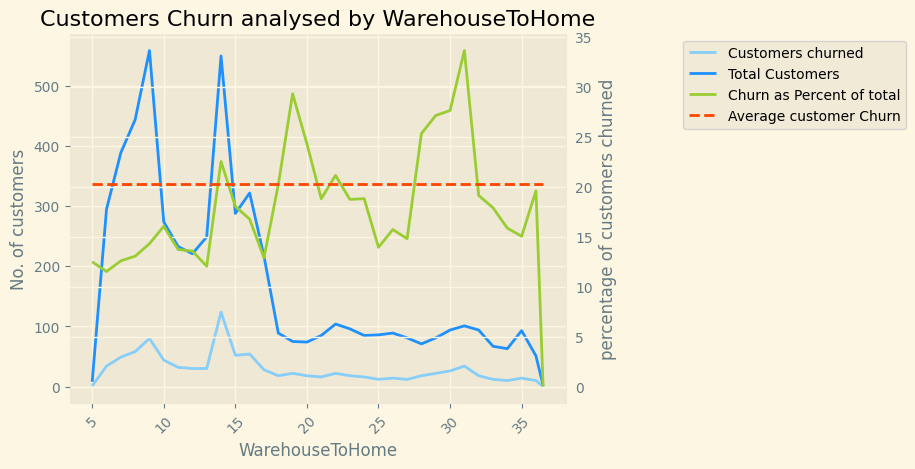

<Figure size 2000x1200 with 0 Axes>

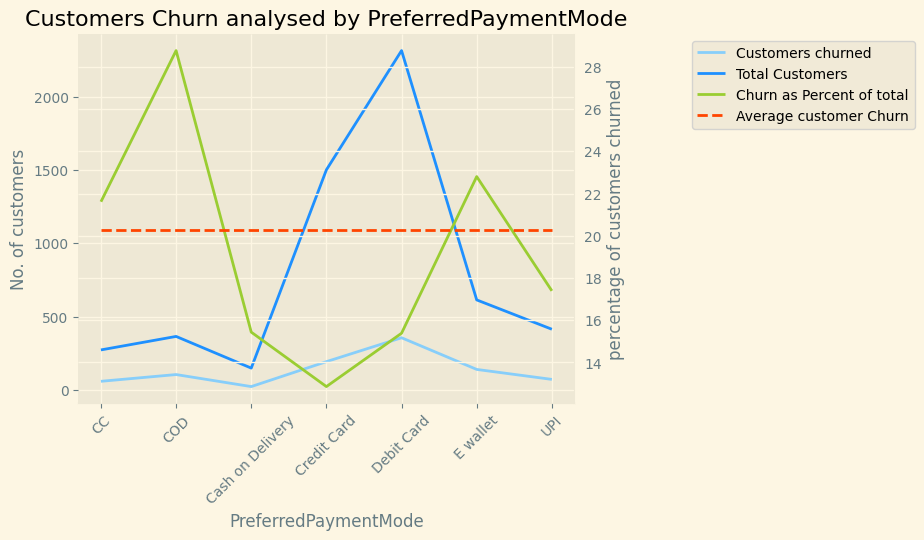

<Figure size 2000x1200 with 0 Axes>

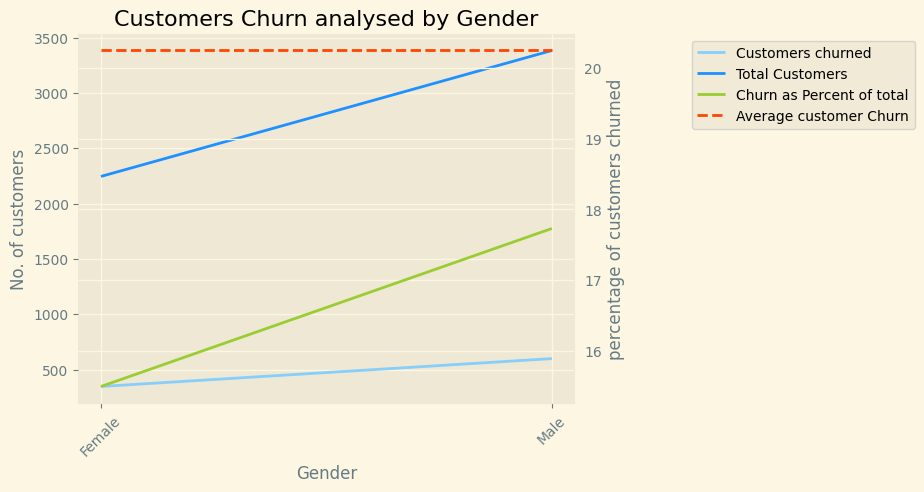

<Figure size 2000x1200 with 0 Axes>

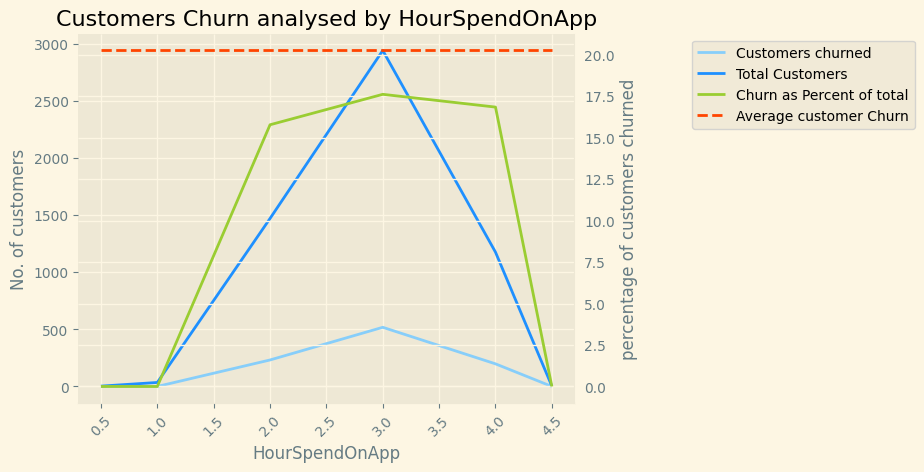

<Figure size 2000x1200 with 0 Axes>

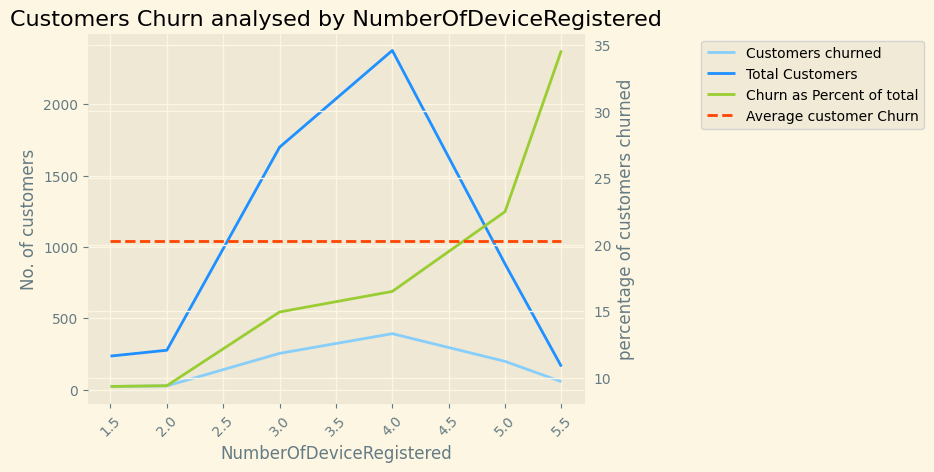

<Figure size 2000x1200 with 0 Axes>

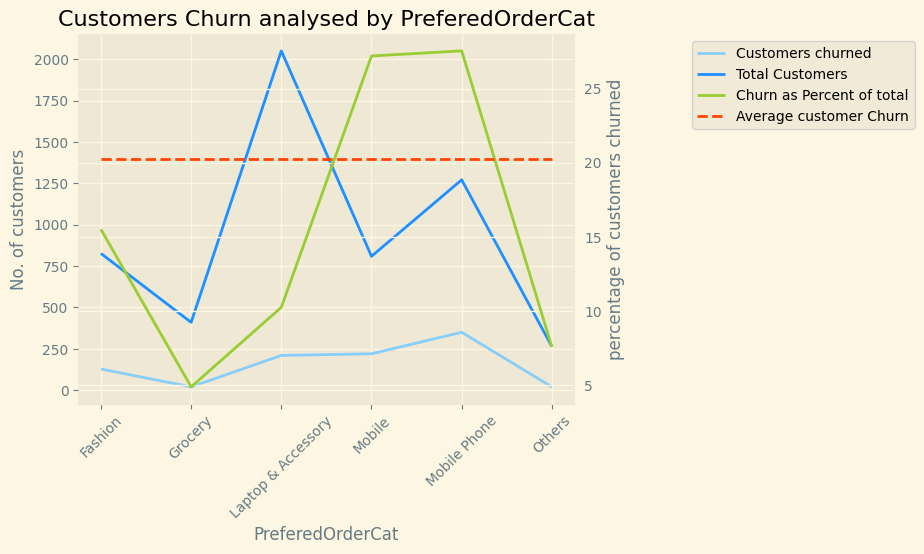

<Figure size 2000x1200 with 0 Axes>

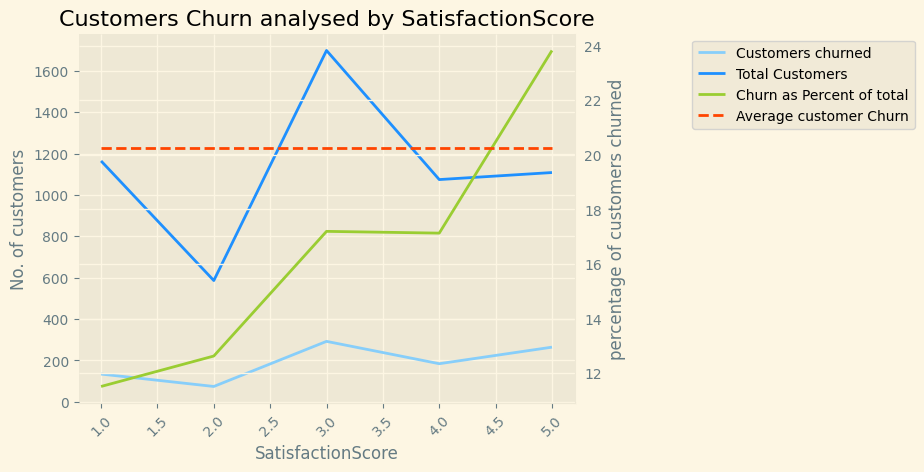

<Figure size 2000x1200 with 0 Axes>

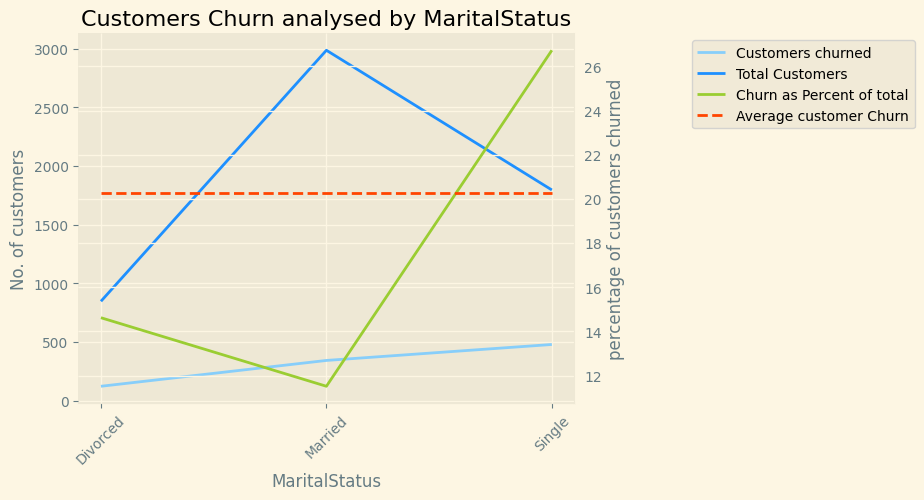

<Figure size 2000x1200 with 0 Axes>

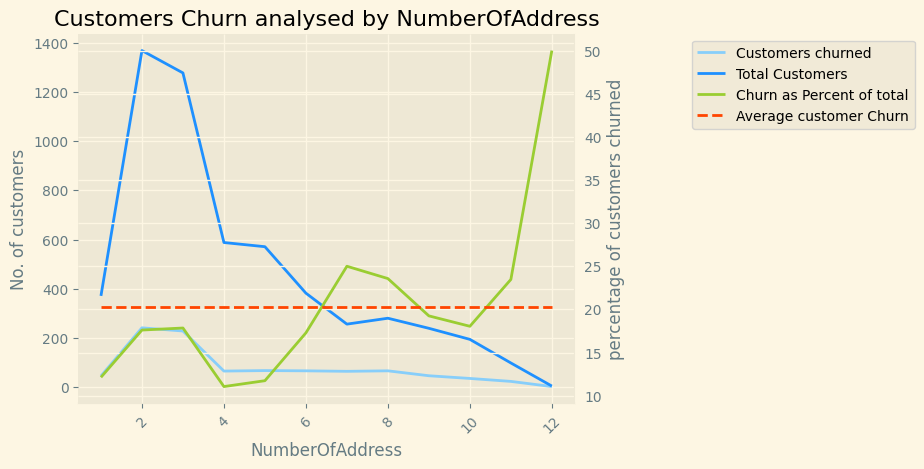

<Figure size 2000x1200 with 0 Axes>

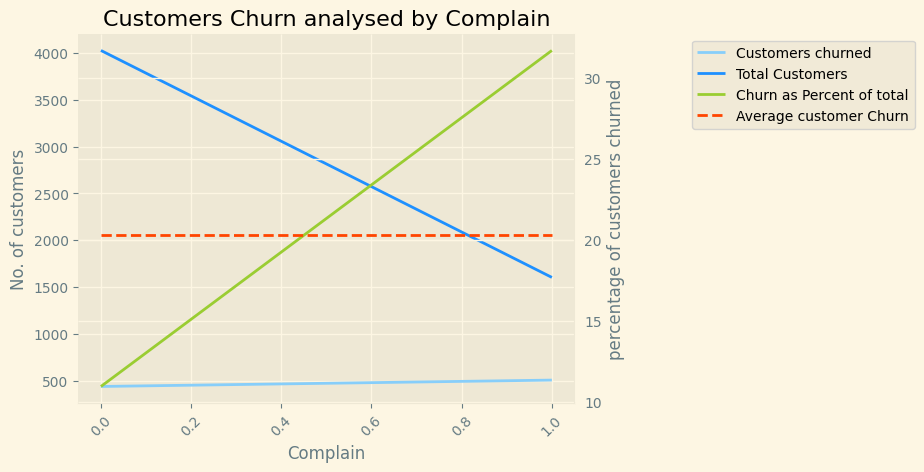

<Figure size 2000x1200 with 0 Axes>

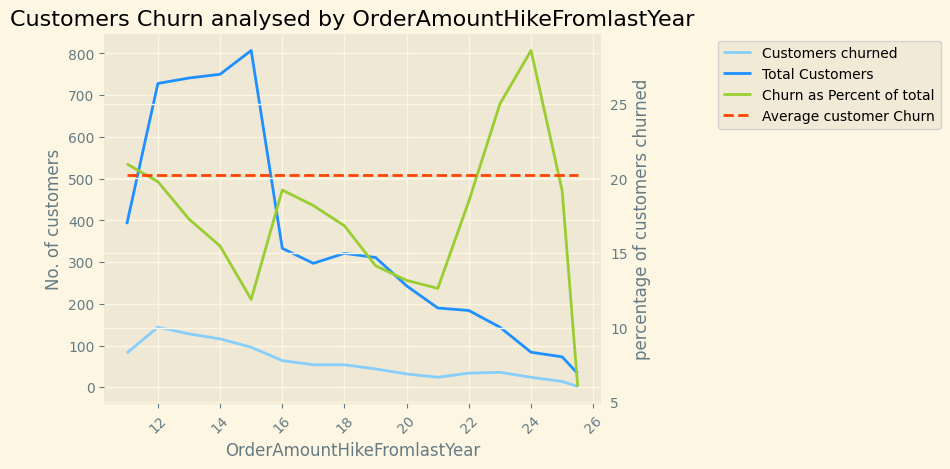

<Figure size 2000x1200 with 0 Axes>

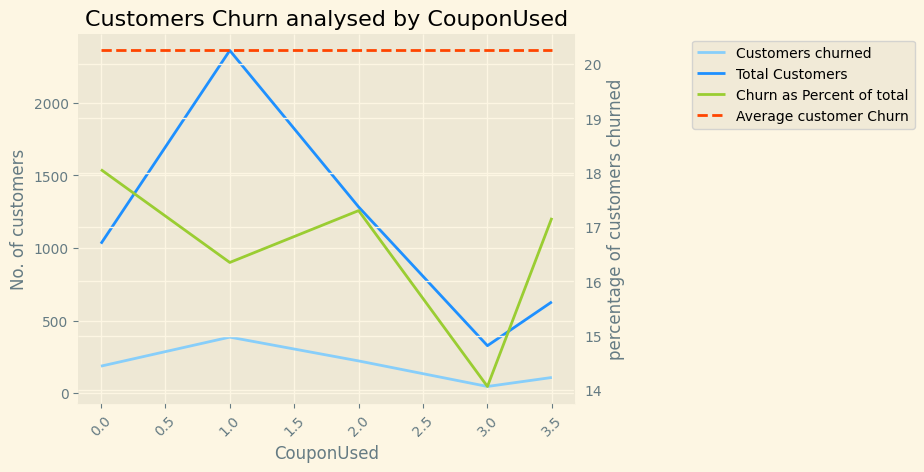

<Figure size 2000x1200 with 0 Axes>

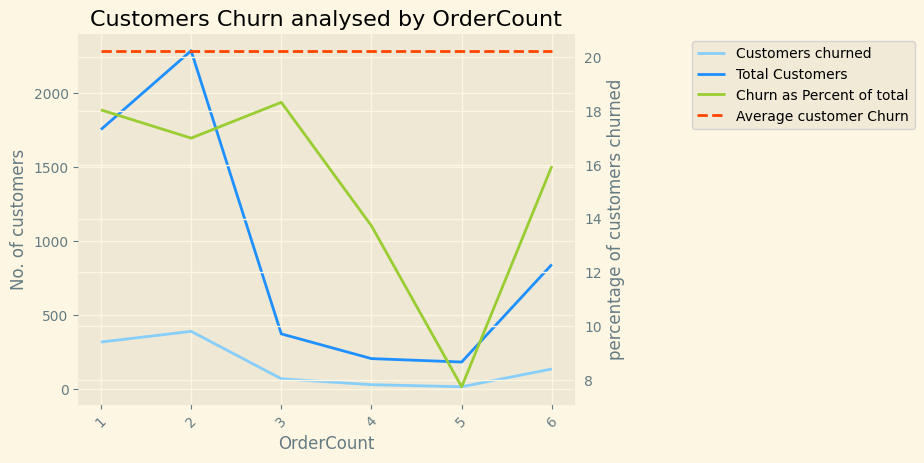

<Figure size 2000x1200 with 0 Axes>

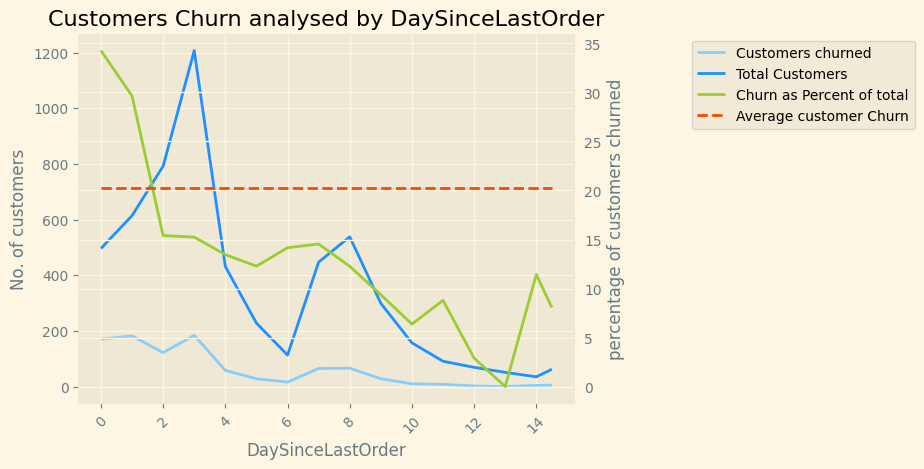

In [31]:
col = ['Tenure', 'PreferredLoginDevice', 'CityTier',
       'WarehouseToHome', 'PreferredPaymentMode', 'Gender', 'HourSpendOnApp',
       'NumberOfDeviceRegistered', 'PreferedOrderCat', 'SatisfactionScore',
       'MaritalStatus', 'NumberOfAddress', 'Complain',
       'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder']

for c in retail_df[col]:
  analysis_chart(c)

<Figure size 2000x1200 with 0 Axes>

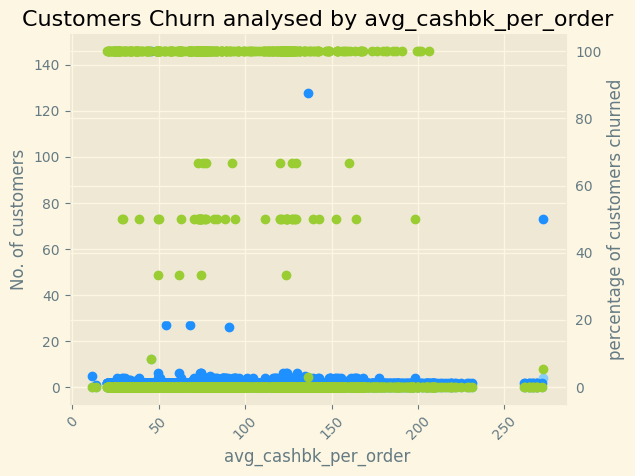

In [32]:
# writing the loop for automating the figure generation
# Writing the loop for one dataframe at a time since we need to have the figures in separate cells so that it becomes easy to analyse and write the conclusion there only.
for i in ['avg_cashbk_per_order']:
    # definig the plot for matplotlib
    plt.figure(figsize=(20,12))
    fig, ax = plt.subplots()
    # defining the title
    title1 = 'Customers Churn analysed by ' + i
    plt.title(title1)
    # defining the lines for the y -axis
    line1 = ax.scatter(d[i][i],d[i]['Customers_churned'], color='lightskyblue', label = 'Customers churned')
    line2 = ax.scatter(d[i][i],d[i]['Total_Customers'], color='dodgerblue', label = 'Total Customers')
    # labelling the x -axis and y-axis
    plt.xlabel (i)
    plt.ylabel ('No. of customers')
     # rotating the labels on the x-axis for better visualisation
    for tick in ax.get_xticklabels():
      tick.set_rotation(45)
    # defining another axis on the right side of the graph
    ax2=ax.twinx()
    # defining the line for the right side y -axis
    line3 = ax2.scatter(d[i][i],d[i]['perc_of_total_cust'], color='yellowgreen', label = 'Churn as Percent of total')
    # labelling the right side y-axis
    plt.ylabel ('percentage of customers churned')
    # adding sns palette for better visualisation
    sns.despine(ax=ax, right=True, left=True)
    sns.despine(ax=ax2, left=True, right=False)

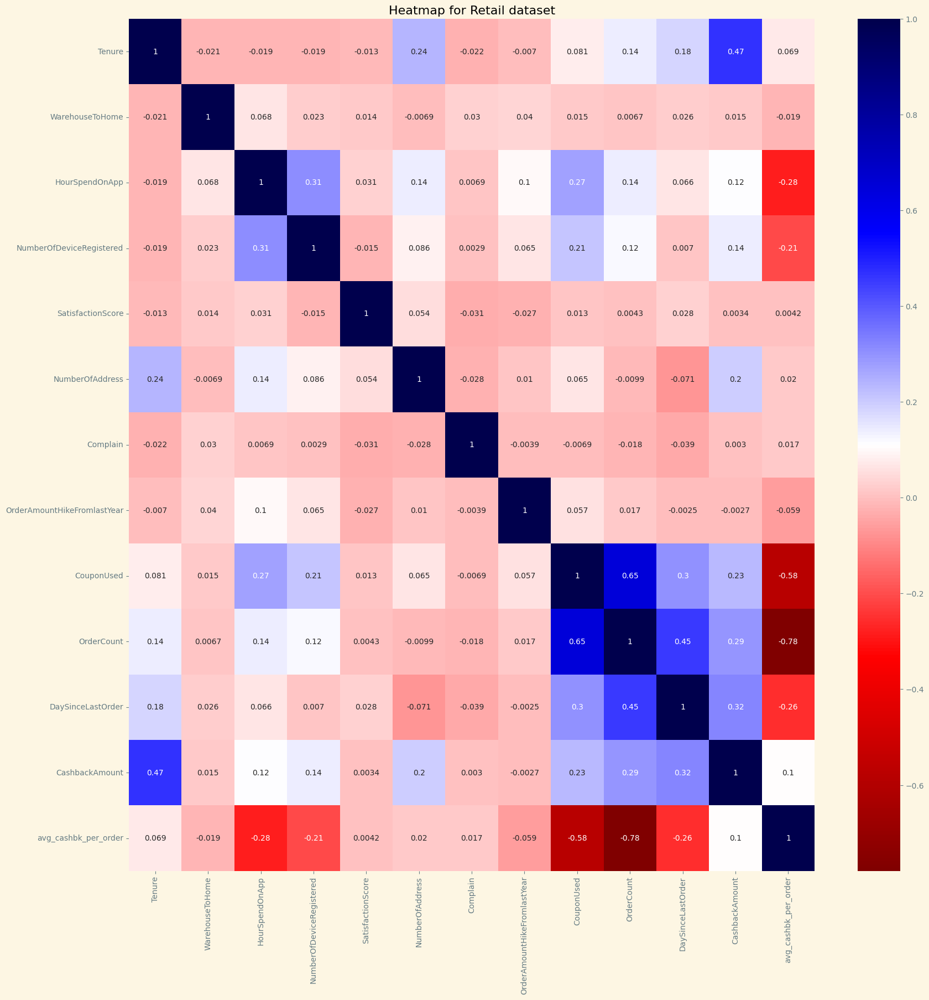

In [33]:
plt.figure(figsize=(20,20))
sns.heatmap(retail_df.corr(), annot=True, cmap='seismic_r')
plt.title("Heatmap for Retail dataset")
plt.show()

#### One Hot Encoding and Scaling of data:

#### One hot encoding

In [34]:
retail_df.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3.0,Laptop & Accessory,2.0,Single,9.0,1.0,11.0,1.0,1.0,5.0,159.93,159.93
1,1,9.0,Phone,1,8.0,UPI,Male,3.0,4.0,Mobile,3.0,Single,7.0,1.0,15.0,0.0,1.0,0.0,120.90,120.90
2,1,9.0,Phone,1,30.0,Debit Card,Male,2.0,4.0,Mobile,3.0,Single,6.0,1.0,14.0,0.0,1.0,3.0,120.28,120.28
3,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4.0,Laptop & Accessory,5.0,Single,8.0,0.0,23.0,0.0,1.0,3.0,134.07,134.07
4,1,0.0,Phone,1,12.0,CC,Male,3.0,3.0,Mobile,5.0,Single,3.0,0.0,11.0,1.0,1.0,3.0,129.60,129.60


In [35]:
retail_encoded = retail_df.copy()

In [36]:
retail_encoded = pd.get_dummies(retail_encoded, drop_first=True)
retail_encoded.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single
0,4.0,6.0,3.0,3.0,2.0,9.0,1.0,11.0,1.0,1.0,5.0,159.93,159.93,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1
1,9.0,8.0,3.0,4.0,3.0,7.0,1.0,15.0,0.0,1.0,0.0,120.90,120.90,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1
2,9.0,30.0,2.0,4.0,3.0,6.0,1.0,14.0,0.0,1.0,3.0,120.28,120.28,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1
3,0.0,15.0,2.0,4.0,5.0,8.0,0.0,23.0,0.0,1.0,3.0,134.07,134.07,1,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1
4,0.0,12.0,3.0,3.0,5.0,3.0,0.0,11.0,1.0,1.0,3.0,129.60,129.60,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1


In [37]:
retail_encoded.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single
0,4.0,6.0,3.0,3.0,2.0,9.0,1.0,11.0,1.0,1.0,5.0,159.93,159.93,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1
1,9.0,8.0,3.0,4.0,3.0,7.0,1.0,15.0,0.0,1.0,0.0,120.90,120.90,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1
2,9.0,30.0,2.0,4.0,3.0,6.0,1.0,14.0,0.0,1.0,3.0,120.28,120.28,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1
3,0.0,15.0,2.0,4.0,5.0,8.0,0.0,23.0,0.0,1.0,3.0,134.07,134.07,1,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1
4,0.0,12.0,3.0,3.0,5.0,3.0,0.0,11.0,1.0,1.0,3.0,129.60,129.60,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1


In [38]:
from sklearn.model_selection import train_test_split
X = retail_encoded.drop(['Churn_1'],axis=1)
y = retail_encoded['Churn_1']
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size = 0.75, random_state=42)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


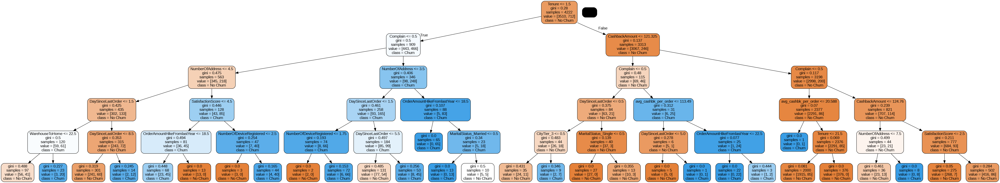

In [39]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(max_depth=5)
dt.fit(X_train, y_train)

!pip install six
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# plotting tree with max_depth=3
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=X.columns, 
                class_names=['No Churn', 'Churn'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())
#Image(graph.create_png(),width=800,height=900)

Evaluating our model :

In [40]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)
print(accuracy_score(y_train, y_train_pred))
confusion_matrix(y_train, y_train_pred)

0.9019422074846044


array([[3461,   49],
       [ 365,  347]])

In [41]:
print(accuracy_score(y_test, y_test_pred))
confusion_matrix(y_test, y_test_pred)

0.8920454545454546


array([[1147,   25],
       [ 127,  109]])

Creating helper functions to evaluate model performance and help plot the 


In [42]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X.columns, 
                    class_names=['Churn', "No Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [43]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

Without setting any hyper-parameters

In [44]:
dt_default = DecisionTreeClassifier(random_state=42)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [45]:
gph = get_dt_graph(dt_default)
Image(gph.create_png())

In [46]:
evaluate_model(dt_default)

Train Accuracy : 1.0
Train Confusion Matrix:
[[3510    0]
 [   0  712]]
--------------------------------------------------
Test Accuracy : 0.9659090909090909
Test Confusion Matrix:
[[1147   25]
 [  23  213]]


Hyperparameter Tuning

In [47]:
dt = DecisionTreeClassifier(random_state=42)
from sklearn.model_selection import GridSearchCV

# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [48]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.044081,0.019399,0.014803,0.010951,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 5}",0.863636,0.856061,0.87109,0.846445,0.859308,0.009132,41
1,0.025825,0.022444,0.005048,0.001610,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 10}",0.863636,0.856061,0.87109,0.846445,0.859308,0.009132,41
2,0.022432,0.006972,0.004571,0.000205,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 20}",0.863636,0.856061,0.87109,0.846445,0.859308,0.009132,41
3,0.028315,0.010082,0.007923,0.003787,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 50}",0.863636,0.856061,0.87109,0.846445,0.859308,0.009132,41
4,0.032168,0.004807,0.008088,0.004421,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 100}",0.863636,0.856061,0.87109,0.846445,0.859308,0.009132,41


In [49]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
45,0.058848,0.021070,0.009753,0.004036,entropy,20,5,"{'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 5}",0.900568,0.907197,0.890995,0.893839,0.898150,0.006274,1
40,0.048396,0.017169,0.006277,0.002669,entropy,10,5,"{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 5}",0.905303,0.892992,0.890047,0.891943,0.895071,0.006001,2
20,0.047474,0.015022,0.008449,0.003637,gini,20,5,"{'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 5}",0.897727,0.882576,0.894787,0.899526,0.893654,0.006616,3
15,0.061073,0.006372,0.011641,0.001377,gini,10,5,"{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 5}",0.896780,0.884470,0.893839,0.898578,0.893417,0.005436,4
41,0.037405,0.008903,0.006529,0.004074,entropy,10,10,"{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 10}",0.891098,0.892045,0.887204,0.895735,0.891521,0.003035,5


In [50]:
grid_search.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=5,
                       random_state=42)

In [51]:
dt_best = grid_search.best_estimator_

In [52]:
evaluate_model(dt_best)

Train Accuracy : 0.96328754144955
Train Confusion Matrix:
[[3450   60]
 [  95  617]]
--------------------------------------------------
Test Accuracy : 0.9133522727272727
Test Confusion Matrix:
[[1123   49]
 [  73  163]]


In [53]:
from sklearn.metrics import classification_report
print(classification_report(y_test, dt_best.predict(X_test)))

              precision    recall  f1-score   support

           0       0.94      0.96      0.95      1172
           1       0.77      0.69      0.73       236

    accuracy                           0.91      1408
   macro avg       0.85      0.82      0.84      1408
weighted avg       0.91      0.91      0.91      1408



#### Scaling the data

In [54]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
num = ['Tenure', 'WarehouseToHome', 'HourSpendOnApp',
       'NumberOfDeviceRegistered', 'SatisfactionScore', 'NumberOfAddress',
       'Complain', 'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount', 'avg_cashbk_per_order']
features = retail_encoded[num]
features = scaler.fit_transform(features)
scaled_df_encoded = retail_encoded.copy()
scaled_df_encoded[num] = features
scaled_df_encoded

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single
0,-0.737959,-1.178795,0.092878,-0.738345,-0.772992,1.875626,1.584290,-1.304023,-0.411136,-0.888745,0.166005,-0.349346,1.259205,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1
1,-0.134866,-0.931534,0.092878,0.323303,-0.048392,1.092812,1.584290,-0.187486,-1.344668,-0.888745,-1.287958,-1.235064,0.486881,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1
2,-0.134866,1.788340,-1.328053,0.323303,-0.048392,0.701405,1.584290,-0.466620,-1.344668,-0.888745,-0.415580,-1.249134,0.474612,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1
3,-1.220433,-0.066119,-1.328053,0.323303,1.400807,1.484219,-0.631198,2.045589,-1.344668,-0.888745,-0.415580,-0.936194,0.747488,1,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1
4,-1.220433,-0.437011,0.092878,-0.738345,1.400807,-0.472817,-0.631198,-1.304023,-0.411136,-0.888745,-0.415580,-1.037633,0.659036,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,-0.014247,1.788340,0.092878,-1.799993,-1.497592,0.701405,-0.631198,0.649917,-0.411136,-0.304276,-0.124788,-0.558578,-0.414361,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0
5626,0.347609,-0.313381,0.092878,1.384951,1.400807,0.701405,-0.631198,0.091648,-0.411136,-0.304276,-0.415580,1.125264,0.319772,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
5627,-1.099814,-0.560642,0.092878,-1.799993,0.676207,-0.472817,1.584290,1.487320,-0.411136,-0.304276,-0.124788,0.251799,-0.061047,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0
5628,1.553794,-0.807903,1.513809,1.384951,0.676207,-0.081410,-0.631198,-0.187486,0.522397,-0.304276,1.329175,0.081146,-0.135450,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0


### Hierarchical Clustering

In [55]:
scaled_df_encoded_h = scaled_df_encoded.copy()
from scipy.cluster.hierarchy import dendrogram, linkage

#linking using the average linking method
link_method=linkage(scaled_df_encoded_h,method = 'average')

In [56]:
link_method


array([[1.00000000e+00, 1.34700000e+03, 0.00000000e+00, 2.00000000e+00],
       [2.00000000e+00, 1.35900000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.10000000e+01, 1.39500000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [1.12530000e+04, 1.12540000e+04, 6.13078020e+00, 5.53000000e+03],
       [1.12550000e+04, 1.12560000e+04, 6.23700127e+00, 5.62600000e+03],
       [1.04360000e+04, 1.12570000e+04, 6.61935699e+00, 5.63000000e+03]])

In [57]:
#selecting the target label or variable
labellist = np.array(scaled_df_encoded_h.Churn_1)
labellist

array([1, 1, 1, ..., 0, 0, 0], dtype=uint8)

In [58]:
len(labellist)

5630

Creating the Dendogram

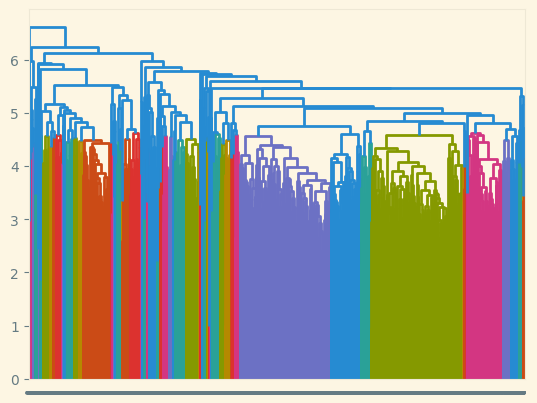

In [59]:
dend = dendrogram(link_method,labels = labellist)

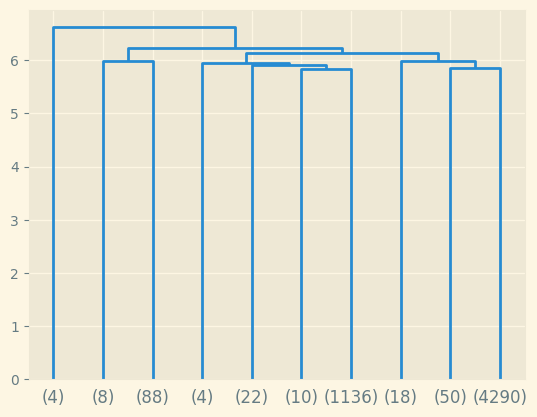

In [60]:
# truncate mode = lastp means last 10 dendrograms to stay and rest to go.
dend = dendrogram(link_method,
                  labels=labellist,
                 truncate_mode='lastp',
                 p=10)

In [61]:
#importing fcluster to create clusters
from scipy.cluster.hierarchy import fcluster
# criterion= maxclust, clusters=4 
clusters_max = fcluster(link_method,4,criterion = 'maxclust')
clusters_max

array([4, 4, 4, ..., 4, 4, 4], dtype=int32)

In [62]:
#appending the clusters to the dataframe
scaled_df_encoded_h['clusters_max'] = clusters_max
scaled_df_encoded_h.head()


,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,clusters_max
0,-0.737959,-1.178795,0.092878,-0.738345,-0.772992,1.875626,1.584290,-1.304023,-0.411136,-0.888745,0.166005,-0.349346,1.259205,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,4
1,-0.134866,-0.931534,0.092878,0.323303,-0.048392,1.092812,1.584290,-0.187486,-1.344668,-0.888745,-1.287958,-1.235064,0.486881,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,4
2,-0.134866,1.788340,-1.328053,0.323303,-0.048392,0.701405,1.584290,-0.466620,-1.344668,-0.888745,-0.415580,-1.249134,0.474612,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,4
3,-1.220433,-0.066119,-1.328053,0.323303,1.400807,1.484219,-0.631198,2.045589,-1.344668,-0.888745,-0.415580,-0.936194,0.747488,1,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,4
4,-1.220433,-0.437011,0.092878,-0.738345,1.400807,-0.472817,-0.631198,-1.304023,-0.411136,-0.888745,-0.415580,-1.037633,0.659036,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,4


In [63]:
df_h = retail_df.copy()
df_h['clusters_max'] = clusters_max


In [64]:
aggdata_max = scaled_df_encoded_h.groupby('clusters_max').median()
aggdata_max['freq'] = scaled_df_encoded_h.clusters_max.value_counts().sort_index()
aggdata_max

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,freq
clusters_max,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,-0.195175,-0.869718,0.803344,1.650363,0.676207,-0.277114,1.584290,-0.047919,-0.411136,-0.596511,2.056156,2.201294,2.136101,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,4
2,1.553794,1.911971,0.092878,-0.738345,-0.772992,-0.081410,1.584290,0.091648,-0.411136,-0.304276,1.329175,1.560975,0.409906,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,96
3,0.106371,-0.313381,0.092878,0.323303,-0.048392,-0.472817,-0.631198,-0.187486,1.455929,2.033597,1.038382,0.146049,-1.233912,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1172
4,-0.255484,-0.189750,0.092878,0.323303,-0.048392,-0.472817,-0.631198,-0.187486,-0.411136,-0.304276,-0.415580,-0.408915,0.247843,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4358


In [65]:
aggdata_max_2 = df_h.groupby('clusters_max').mean()
aggdata_max_2['freq'] = df_h.clusters_max.value_counts().sort_index()
aggdata_max_2

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,freq
clusters_max,,,,,,,,,,,,,,
1,8.500000,8.500000,3.500000,5.250000,4.000000,3.500000,1.000000,15.50000,1.250000,1.500000,11.500000,272.326250,204.244687,4
2,21.041667,30.208333,2.958333,3.276042,2.312500,3.958333,0.687500,16.62500,1.510417,2.656250,8.395833,232.486263,105.839287,96
3,11.938567,15.106655,2.917235,3.700512,3.059727,3.751706,0.242321,15.62116,2.563993,5.489761,7.363481,192.997217,36.283174,1172
4,9.389399,15.333180,2.938274,3.701927,3.084442,4.336852,0.286829,15.66441,1.136875,1.720055,3.546122,169.223195,112.124791,4358


## K means Clustering


In [66]:
scaled_df_encoded_k= scaled_df_encoded.copy()
from sklearn.cluster import KMeans 
k_means = KMeans(n_clusters = 2)
k_means.fit(scaled_df_encoded_k)
k_means.labels_


array([1, 1, 1, ..., 1, 0, 1], dtype=int32)

In [67]:
k_means.inertia_

77898.33799976068

In [68]:
k_means = KMeans(n_clusters = 3)
k_means.fit(scaled_df_encoded_k)
k_means.inertia_

71780.38858915068

In [69]:
k_means.labels_

array([1, 1, 1, ..., 1, 2, 1], dtype=int32)

In [70]:
k_means = KMeans(n_clusters = 4)
k_means.fit(scaled_df_encoded_k)
k_means.inertia_

67757.64344625486

In [71]:
k_means.labels_

array([1, 1, 1, ..., 1, 0, 1], dtype=int32)

In [72]:
k_means = KMeans(n_clusters = 5)
k_means.fit(scaled_df_encoded_k)
k_means.inertia_

65595.04324983503

In [73]:
k_means.labels_

array([3, 3, 0, ..., 3, 1, 0], dtype=int32)

In [74]:
#Within-Cluster-Sum of Squared Errors (WSS)
wss = []
for i in range(1,20):
  k_means = KMeans(n_clusters = i)
  k_means.fit(scaled_df_encoded_k)
  wss.append(k_means.inertia_)
wss

[89242.39982238013,
 77898.35662069623,
 71780.40848221649,
 67757.64072895725,
 65584.11128206464,
 63772.832136680096,
 62125.95016264622,
 60758.4887179325,
 59595.779123163025,
 58508.76356011233,
 57628.98671889082,
 56751.78076766079,
 56034.23369610077,
 55409.54482900871,
 54762.566752471095,
 54026.10833993537,
 53337.481544734634,
 52921.11519404467,
 52410.1548743923]

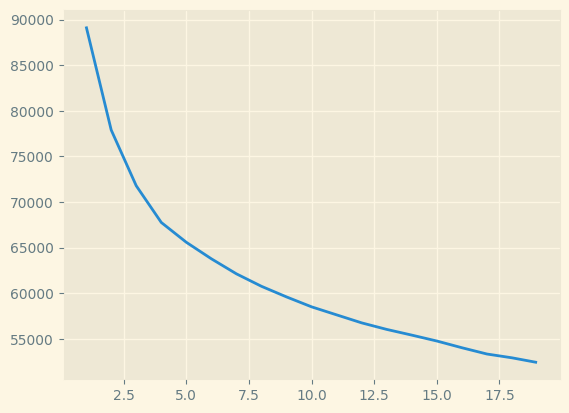

In [75]:
plt.plot(range(1,20), wss)


In [76]:
from sklearn.metrics import silhouette_samples, silhouette_score
# Silhoutte score for 2 cluster
Sil_Score = []
for i in range(2,20):
  k_means = KMeans(n_clusters=i)
  k_means.fit(scaled_df_encoded_k)
  labels = k_means.labels_
  ss = silhouette_score(scaled_df_encoded_k,labels)
  Sil_Score.append(ss)
Sil_Score

[0.11633415292900919,
 0.10086378269048317,
 0.1015234118053477,
 0.08978459951327081,
 0.08544920296684544,
 0.08426109081678002,
 0.0812877692455281,
 0.07623283998701003,
 0.07286900164750647,
 0.07214289540393684,
 0.07120367289766662,
 0.07254744002415747,
 0.068755834185489,
 0.06421975489990929,
 0.06515763263567736,
 0.06922532873013272,
 0.06900394406917455,
 0.06643944349493124]

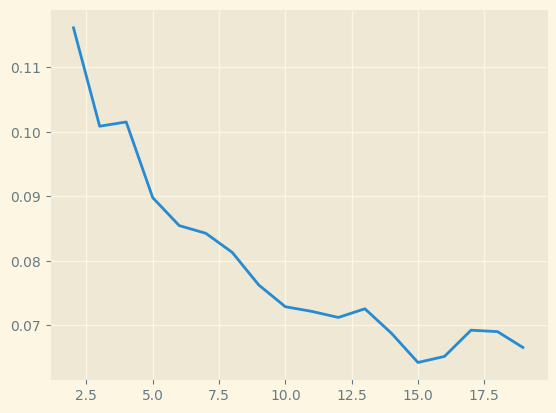

In [77]:
plt.plot(range(2,20), Sil_Score)

In [78]:
# taking ideal number of clusters as 4
k_means = KMeans(n_clusters = 4)
k_means.fit(scaled_df_encoded_k)
labels = k_means.labels_
scaled_df_encoded_k["Clus_kmeans"] = labels
scaled_df_encoded_k.head(10)

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Clus_kmeans
0,-0.737959,-1.178795,0.092878,-0.738345,-0.772992,1.875626,1.584290,-1.304023,-0.411136,-0.888745,0.166005,-0.349346,1.259205,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,2
1,-0.134866,-0.931534,0.092878,0.323303,-0.048392,1.092812,1.584290,-0.187486,-1.344668,-0.888745,-1.287958,-1.235064,0.486881,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,2
2,-0.134866,1.788340,-1.328053,0.323303,-0.048392,0.701405,1.584290,-0.466620,-1.344668,-0.888745,-0.415580,-1.249134,0.474612,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,2
3,-1.220433,-0.066119,-1.328053,0.323303,1.400807,1.484219,-0.631198,2.045589,-1.344668,-0.888745,-0.415580,-0.936194,0.747488,1,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,2
4,-1.220433,-0.437011,0.092878,-0.738345,1.400807,-0.472817,-0.631198,-1.304023,-0.411136,-0.888745,-0.415580,-1.037633,0.659036,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,2
5,-1.220433,0.799295,0.092878,1.384951,1.400807,-0.864224,1.584290,1.766454,1.922695,2.033597,0.747590,-0.820004,-1.446434,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,3
6,-0.134866,-0.560642,-1.328053,-0.738345,-0.772992,-0.081410,-0.631198,-0.466620,-1.344668,-0.888745,-1.287958,-1.235972,0.486089,1,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,2
7,-0.134866,-1.178795,0.092878,-0.738345,-0.772992,-0.472817,1.584290,0.091648,0.522397,-0.304276,-1.287958,-1.188997,-0.689216,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,2
8,0.347609,-0.807903,0.092878,0.323303,-0.048392,-0.864224,1.584290,-0.466620,-1.344668,-0.888745,-0.706373,-1.100493,0.604224,1,0,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,2
9,-0.134866,1.911971,-1.328053,1.384951,-0.048392,-0.864224,-0.631198,-1.024889,-0.411136,-0.888745,-0.997165,-1.188997,0.527051,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,2


In [79]:
aggdata_k = scaled_df_encoded_k.groupby('Clus_kmeans').mean()
aggdata_k['freq'] = scaled_df_encoded_k.Clus_kmeans.value_counts().sort_index()
aggdata_k

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,freq
Clus_kmeans,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.345036,0.075969,0.684805,0.587569,0.007948,0.188686,0.005217,0.181026,0.138550,-0.181828,-0.256053,-0.172007,-0.337716,0.219762,0.542117,0.157667,0.045896,0.306695,0.079914,0.011879,0.304536,0.417927,0.106911,0.072894,0.614471,0.000000,0.401728,0.016739,0.496760,0.000000,0.505400,0.355832,1852
1,1.270535,0.021459,-0.149139,-0.049301,-0.012864,0.429692,0.083476,-0.120494,-0.120235,-0.308047,0.293954,1.516888,0.909595,0.041290,0.767742,0.000000,0.037419,0.277419,0.005161,0.065806,0.316129,0.419355,0.123871,0.069677,0.548387,0.375484,0.092903,0.000000,0.003871,0.205161,0.575484,0.237419,775
2,-0.318871,-0.078838,-0.642658,-0.575236,-0.005908,-0.265852,-0.006964,-0.115732,-0.809483,-0.779276,-0.459152,-0.705723,0.703474,0.189468,0.263844,0.437568,0.047231,0.291531,0.079805,0.015744,0.180239,0.408795,0.105320,0.078719,0.623779,0.001086,0.415309,0.385451,0.125407,0.000000,0.509772,0.353420,1842
3,0.208186,-0.010427,0.026788,0.008283,0.005282,-0.166029,-0.052995,-0.024718,1.143545,1.732049,0.940700,0.381492,-1.184570,0.137812,0.585702,0.114556,0.035314,0.346253,0.056848,0.040482,0.310078,0.397933,0.108527,0.068906,0.578811,0.100775,0.403962,0.058570,0.100775,0.090439,0.572782,0.260121,1161


In [80]:
df_k = retail_df.copy()
df_k['Clus_kmeans'] = scaled_df_encoded_k["Clus_kmeans"]

In [81]:
aggdata_k2 = df_k.groupby('Clus_kmeans').mean()
aggdata_k2['freq'] = df_k.Clus_kmeans.value_counts().sort_index()
aggdata_k2

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,freq
Clus_kmeans,,,,,,,,,,,,,,
0,7.257559,16.149298,3.416577,4.248920,3.077754,4.690065,0.287257,16.320194,1.588823,2.209503,3.548596,167.744569,79.228327,1852
1,20.651613,15.708387,2.829677,3.649032,3.049032,5.305806,0.322581,15.240000,1.311613,1.993548,5.440000,242.167250,142.262221,775
2,7.474484,14.897123,2.482356,3.153637,3.058632,3.528773,0.281759,15.257058,0.573290,1.187296,2.850163,144.225895,131.845720,1842
3,11.844100,15.450474,2.953488,3.703273,3.074074,3.783807,0.260982,15.583118,2.665375,5.484065,7.664083,192.135011,36.431845,1161


## Building Classification models
Here since we have a scaled & encoded dataframe, along with the clusters. lets use that dataframe

In [82]:
scaled_df_encoded_h


,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,clusters_max
0,-0.737959,-1.178795,0.092878,-0.738345,-0.772992,1.875626,1.584290,-1.304023,-0.411136,-0.888745,0.166005,-0.349346,1.259205,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,4
1,-0.134866,-0.931534,0.092878,0.323303,-0.048392,1.092812,1.584290,-0.187486,-1.344668,-0.888745,-1.287958,-1.235064,0.486881,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,4
2,-0.134866,1.788340,-1.328053,0.323303,-0.048392,0.701405,1.584290,-0.466620,-1.344668,-0.888745,-0.415580,-1.249134,0.474612,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,4
3,-1.220433,-0.066119,-1.328053,0.323303,1.400807,1.484219,-0.631198,2.045589,-1.344668,-0.888745,-0.415580,-0.936194,0.747488,1,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,4
4,-1.220433,-0.437011,0.092878,-0.738345,1.400807,-0.472817,-0.631198,-1.304023,-0.411136,-0.888745,-0.415580,-1.037633,0.659036,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,-0.014247,1.788340,0.092878,-1.799993,-1.497592,0.701405,-0.631198,0.649917,-0.411136,-0.304276,-0.124788,-0.558578,-0.414361,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,4
5626,0.347609,-0.313381,0.092878,1.384951,1.400807,0.701405,-0.631198,0.091648,-0.411136,-0.304276,-0.415580,1.125264,0.319772,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,4
5627,-1.099814,-0.560642,0.092878,-1.799993,0.676207,-0.472817,1.584290,1.487320,-0.411136,-0.304276,-0.124788,0.251799,-0.061047,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,4
5628,1.553794,-0.807903,1.513809,1.384951,0.676207,-0.081410,-0.631198,-0.187486,0.522397,-0.304276,1.329175,0.081146,-0.135450,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,4


In [83]:
scaled_df_encoded_h['clusters_max'] = scaled_df_encoded_h['clusters_max'].astype('object')

In [84]:
scaled_df_encoded_h

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,clusters_max
0,-0.737959,-1.178795,0.092878,-0.738345,-0.772992,1.875626,1.584290,-1.304023,-0.411136,-0.888745,0.166005,-0.349346,1.259205,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,4
1,-0.134866,-0.931534,0.092878,0.323303,-0.048392,1.092812,1.584290,-0.187486,-1.344668,-0.888745,-1.287958,-1.235064,0.486881,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,4
2,-0.134866,1.788340,-1.328053,0.323303,-0.048392,0.701405,1.584290,-0.466620,-1.344668,-0.888745,-0.415580,-1.249134,0.474612,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,4
3,-1.220433,-0.066119,-1.328053,0.323303,1.400807,1.484219,-0.631198,2.045589,-1.344668,-0.888745,-0.415580,-0.936194,0.747488,1,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,4
4,-1.220433,-0.437011,0.092878,-0.738345,1.400807,-0.472817,-0.631198,-1.304023,-0.411136,-0.888745,-0.415580,-1.037633,0.659036,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,-0.014247,1.788340,0.092878,-1.799993,-1.497592,0.701405,-0.631198,0.649917,-0.411136,-0.304276,-0.124788,-0.558578,-0.414361,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,4
5626,0.347609,-0.313381,0.092878,1.384951,1.400807,0.701405,-0.631198,0.091648,-0.411136,-0.304276,-0.415580,1.125264,0.319772,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,4
5627,-1.099814,-0.560642,0.092878,-1.799993,0.676207,-0.472817,1.584290,1.487320,-0.411136,-0.304276,-0.124788,0.251799,-0.061047,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,4
5628,1.553794,-0.807903,1.513809,1.384951,0.676207,-0.081410,-0.631198,-0.187486,0.522397,-0.304276,1.329175,0.081146,-0.135450,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,4


In [85]:
scaled_df_encoded_h1 = pd.get_dummies(scaled_df_encoded_h, drop_first=True)
scaled_df_encoded_h1

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,Churn_1,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,clusters_max_2,clusters_max_3,clusters_max_4
0,-0.737959,-1.178795,0.092878,-0.738345,-0.772992,1.875626,1.584290,-1.304023,-0.411136,-0.888745,0.166005,-0.349346,1.259205,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1
1,-0.134866,-0.931534,0.092878,0.323303,-0.048392,1.092812,1.584290,-0.187486,-1.344668,-0.888745,-1.287958,-1.235064,0.486881,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,1
2,-0.134866,1.788340,-1.328053,0.323303,-0.048392,0.701405,1.584290,-0.466620,-1.344668,-0.888745,-0.415580,-1.249134,0.474612,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1
3,-1.220433,-0.066119,-1.328053,0.323303,1.400807,1.484219,-0.631198,2.045589,-1.344668,-0.888745,-0.415580,-0.936194,0.747488,1,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,1
4,-1.220433,-0.437011,0.092878,-0.738345,1.400807,-0.472817,-0.631198,-1.304023,-0.411136,-0.888745,-0.415580,-1.037633,0.659036,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,-0.014247,1.788340,0.092878,-1.799993,-1.497592,0.701405,-0.631198,0.649917,-0.411136,-0.304276,-0.124788,-0.558578,-0.414361,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1
5626,0.347609,-0.313381,0.092878,1.384951,1.400807,0.701405,-0.631198,0.091648,-0.411136,-0.304276,-0.415580,1.125264,0.319772,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1
5627,-1.099814,-0.560642,0.092878,-1.799993,0.676207,-0.472817,1.584290,1.487320,-0.411136,-0.304276,-0.124788,0.251799,-0.061047,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1
5628,1.553794,-0.807903,1.513809,1.384951,0.676207,-0.081410,-0.631198,-0.187486,0.522397,-0.304276,1.329175,0.081146,-0.135450,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1


## Correcting the imbalanced data with the help of SMOTE oversampling


In [86]:
X=scaled_df_encoded_h1.drop(['Churn_1'],axis=1)
y=scaled_df_encoded_h1['Churn_1']

In [87]:
print('Before OverSampling, the shape of X: {}'.format(X.shape)) 
print('Before OverSampling, the shape of y: {} \n'.format(y.shape)) 
  
print("Before OverSampling, counts of label '1': {}".format(sum(y == 1))) 
print("Before OverSampling, counts of label '0': {}".format(sum(y == 0)))

Before OverSampling, the shape of X: (5630, 34)
Before OverSampling, the shape of y: (5630,) 

Before OverSampling, counts of label '1': 948
Before OverSampling, counts of label '0': 4682


In [88]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state=33)
X_res, y_res = sm.fit_resample(X, y.ravel())

In [89]:
print('After OverSampling, the shape of X: {}'.format(X_res.shape)) 
print('After OverSampling, the shape of y: {} \n'.format(y_res.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_res == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_res == 0)))

After OverSampling, the shape of X: (9364, 34)
After OverSampling, the shape of y: (9364,) 

After OverSampling, counts of label '1': 4682
After OverSampling, counts of label '0': 4682


In [90]:
X_res=pd.DataFrame(X_res)
#Renaming column name of Target variable
y_res=pd.DataFrame(y_res)
y_res.columns = ['Churn_1']
scaled_df_encoded_h1_smote = pd.concat([X_res,y_res], axis=1)
scaled_df_encoded_h1_smote

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,clusters_max_2,clusters_max_3,clusters_max_4,Churn_1
0,-0.737959,-1.178795,0.092878,-0.738345,-0.772992,1.875626,1.584290,-1.304023,-0.411136,-0.888745,0.166005,-0.349346,1.259205,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1
1,-0.134866,-0.931534,0.092878,0.323303,-0.048392,1.092812,1.584290,-0.187486,-1.344668,-0.888745,-1.287958,-1.235064,0.486881,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,1,1
2,-0.134866,1.788340,-1.328053,0.323303,-0.048392,0.701405,1.584290,-0.466620,-1.344668,-0.888745,-0.415580,-1.249134,0.474612,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,1
3,-1.220433,-0.066119,-1.328053,0.323303,1.400807,1.484219,-0.631198,2.045589,-1.344668,-0.888745,-0.415580,-0.936194,0.747488,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,1,1
4,-1.220433,-0.437011,0.092878,-0.738345,1.400807,-0.472817,-0.631198,-1.304023,-0.411136,-0.888745,-0.415580,-1.037633,0.659036,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9359,-1.099814,-0.744466,1.513809,0.323303,-1.497592,-0.409294,1.584290,-0.564548,-0.411136,-0.209421,-0.997165,-0.759300,-0.581052,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1
9360,0.347609,-1.079355,0.092878,-0.738345,-0.048392,1.484219,-0.631198,-1.024889,-0.411136,-0.888745,-0.997165,-0.182550,1.404646,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,1
9361,-1.099814,-0.664162,0.092878,0.973502,0.232431,-0.624510,-0.631198,-0.033899,-0.411136,-0.304276,-0.415580,-0.644926,-0.452008,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1
9362,-1.130193,1.880833,1.155934,1.782082,-0.955490,-0.571397,1.584290,-0.257789,0.287278,-0.451480,-1.070404,-1.031199,-0.343369,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,1


## Train-Test Split

In [91]:
from sklearn.model_selection import train_test_split
X = scaled_df_encoded_h1_smote.drop(['Churn_1'],axis=1)
y = scaled_df_encoded_h1_smote['Churn_1']
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size = 0.75, random_state=42)

## Logistic Regression

In [92]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
model_lr = LogisticRegression()
model_lr.fit(X_train, y_train)

LogisticRegression()

In [93]:
ytrain_predict = model_lr.predict(X_train)
ytest_predict = model_lr.predict(X_test)

In [94]:
ytest_predict_prob=model_lr.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.981292,0.018708
1,0.995808,0.004192
2,0.092582,0.907418
3,0.194875,0.805125
4,0.027578,0.972422


In [95]:
# Accuracy - Training Data
model_lr.score(X_train, y_train)

0.8494945180122455

AUC: 0.931


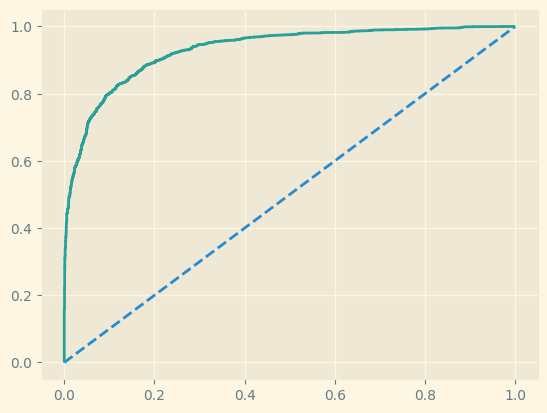

In [96]:
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix
# predict probabilities
probs = model_lr.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr)

In [97]:
# Accuracy - Test Data
model_lr.score(X_test, y_test)

0.8479282357966681

<Axes: >

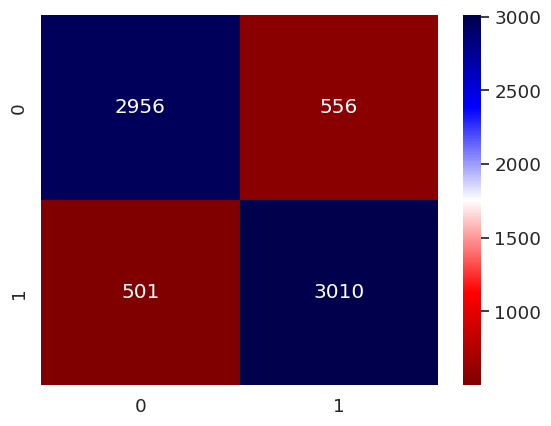

In [98]:
#confusion matrix training Data
cm_lr = confusion_matrix(y_train, ytrain_predict)
cm_lr
sns.set(font_scale = 1.2)
sns.heatmap(cm_lr,annot = True,fmt = 'd', cmap ='seismic_r')

In [99]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.86      0.84      0.85      3512
           1       0.84      0.86      0.85      3511

    accuracy                           0.85      7023
   macro avg       0.85      0.85      0.85      7023
weighted avg       0.85      0.85      0.85      7023



<Axes: >

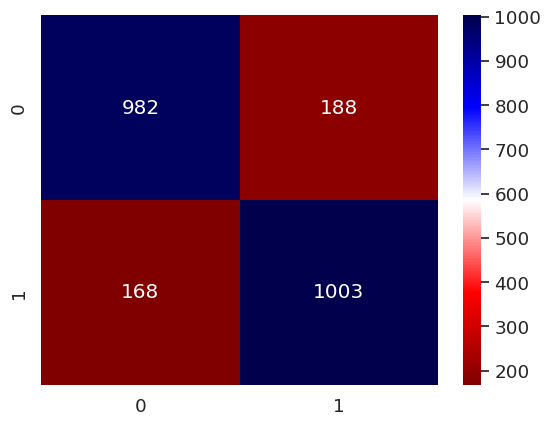

In [100]:
#confusion matrix training Data
cm_lr = confusion_matrix(y_test, ytest_predict)
cm_lr
sns.set(font_scale = 1.2)
sns.heatmap(cm_lr,annot = True,fmt = 'd', cmap ='seismic_r')

In [101]:
#Test Data Accuracy
test_acc=model_lr.score(X_test,y_test)
test_acc

0.8479282357966681

In [102]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.85      0.84      0.85      1170
           1       0.84      0.86      0.85      1171

    accuracy                           0.85      2341
   macro avg       0.85      0.85      0.85      2341
weighted avg       0.85      0.85      0.85      2341



### Linear Discriminant Analysis


In [103]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
LDA_model= LinearDiscriminantAnalysis()
LDA_model.fit(X_train, y_train)

LinearDiscriminantAnalysis()

0.8497792965968959
              precision    recall  f1-score   support

           0       0.86      0.83      0.85      3512
           1       0.84      0.87      0.85      3511

    accuracy                           0.85      7023
   macro avg       0.85      0.85      0.85      7023
weighted avg       0.85      0.85      0.85      7023



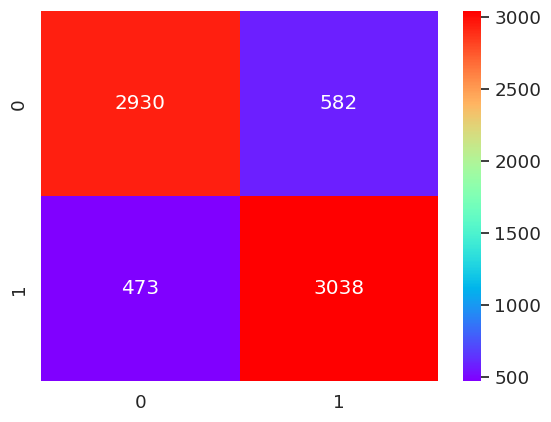

In [104]:
y_train_predict = LDA_model.predict(X_train)
model_score = LDA_model.score(X_train, y_train)
print(model_score)

#confusion matrix training Data
cm_train_lda = confusion_matrix(y_train, y_train_predict)
sns.set(font_scale = 1.2)
sns.heatmap(cm_train_lda, annot = True,fmt = 'd', cmap='rainbow')
print(metrics.classification_report(y_train, y_train_predict))

0.8457923964117898
              precision    recall  f1-score   support

           0       0.86      0.83      0.84      1170
           1       0.83      0.86      0.85      1171

    accuracy                           0.85      2341
   macro avg       0.85      0.85      0.85      2341
weighted avg       0.85      0.85      0.85      2341



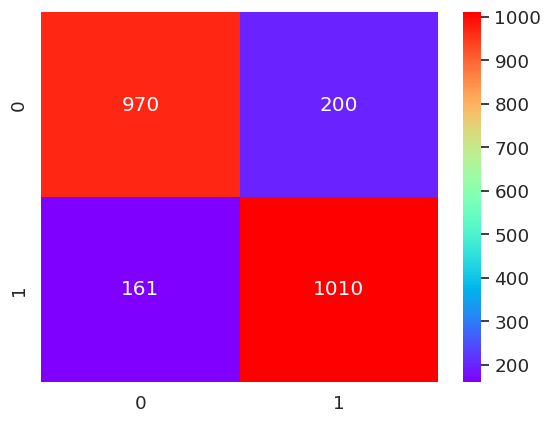

In [105]:
## Performance Matrix on test data set
y_test_predict = LDA_model.predict(X_test)
model_score = LDA_model.score(X_test, y_test)
print(model_score)
#confusion matrix test Data
cm_test_lda = confusion_matrix(y_test, y_test_predict)
sns.set(font_scale = 1.2)
sns.heatmap(cm_test_lda, annot = True,fmt = 'd', cmap='rainbow')
print(metrics.classification_report(y_test, y_test_predict))

AUC: 0.930


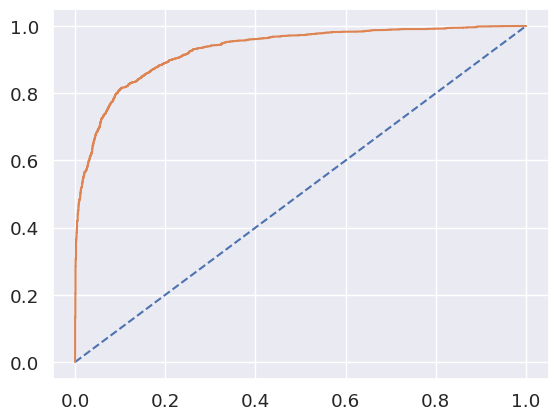

In [106]:
# predict probabilities
probs = LDA_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr)

AUC: 0.930


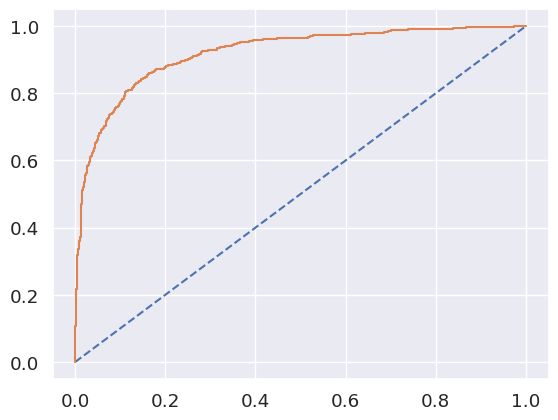

In [107]:
# predict probabilities
probs = LDA_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr)

In [108]:
X_train.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,avg_cashbk_per_order,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,CityTier_2,CityTier_3,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,clusters_max_2,clusters_max_3,clusters_max_4
4903,2.518743,-0.807903,1.513809,1.384951,-1.497592,0.309997,1.58429,-0.466620,-0.411136,1.449128,-0.124788,1.972858,-0.867564,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1
6070,-1.099814,-0.510034,0.092878,0.323303,-1.299848,-0.366002,1.58429,0.015472,1.731624,2.033597,0.787269,-0.315313,-1.373088,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0
8463,-0.191379,1.450974,-1.328053,-0.738345,-0.086114,0.330373,1.58429,-1.274961,-1.344668,-0.888745,-0.951750,-1.221942,0.498324,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
8831,-0.441004,-1.139572,0.543681,1.553360,0.676207,1.608396,1.58429,-0.657197,-0.114964,0.465619,0.839846,-1.026480,-1.124389,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1
6760,-0.134866,1.304876,0.029330,-0.738345,0.643801,-1.185612,1.58429,-1.304023,-1.344668,-0.888745,-0.163803,-1.222065,0.498216,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1


In [109]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(max_depth=3)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


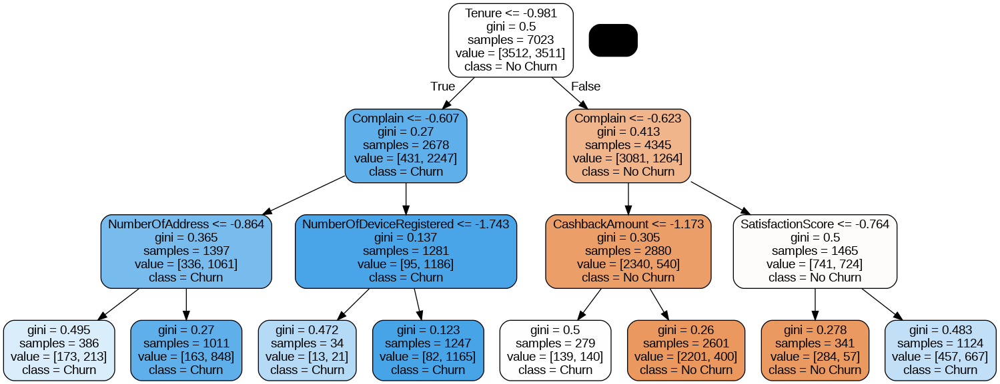

In [110]:
!pip install six
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# plotting tree with max_depth=3
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=X.columns, 
                class_names=['No Churn', 'Churn'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())
#Image(graph.create_png(),width=800,height=900)

##Random Forest

In [111]:
from sklearn.ensemble import RandomForestClassifier

RF_model=RandomForestClassifier(n_estimators=100,random_state=1)
RF_model.fit(X_train, y_train)

RandomForestClassifier(random_state=1)

1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3512
           1       1.00      1.00      1.00      3511

    accuracy                           1.00      7023
   macro avg       1.00      1.00      1.00      7023
weighted avg       1.00      1.00      1.00      7023

Confusion Matrix


<Axes: >

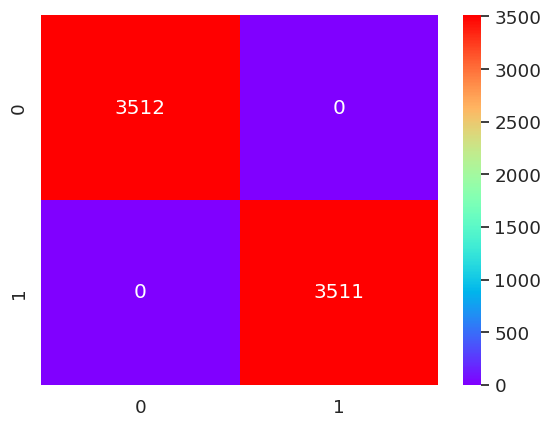

In [112]:
## Performance Matrix on train data set
y_train_predict = RF_model.predict(X_train)
model_score =RF_model.score(X_train, y_train)
print(model_score)
print(metrics.classification_report(y_train, y_train_predict))
#confusion matrix training Data
cm_train_rf = confusion_matrix(y_train, y_train_predict)
print('Confusion Matrix')
sns.set(font_scale = 1.2)
sns.heatmap(cm_train_rf, annot = True,fmt = 'd', cmap='rainbow')

0.9782144382742418
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1170
           1       0.97      0.98      0.98      1171

    accuracy                           0.98      2341
   macro avg       0.98      0.98      0.98      2341
weighted avg       0.98      0.98      0.98      2341

Confusion Matrix


<Axes: >

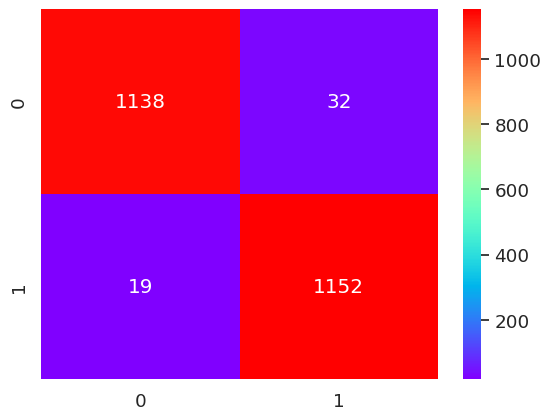

In [113]:
## Performance Matrix on test data set
y_test_predict = RF_model.predict(X_test)
model_score = RF_model.score(X_test, y_test)
print(model_score)
print(metrics.classification_report(y_test, y_test_predict))
#confusion matrix test Data
cm_test_rf = confusion_matrix(y_test, y_test_predict)
sns.set(font_scale = 1.2)
print('Confusion Matrix')
sns.heatmap(cm_test_rf, annot = True,fmt = 'd', cmap='rainbow')

AUC: 1.000


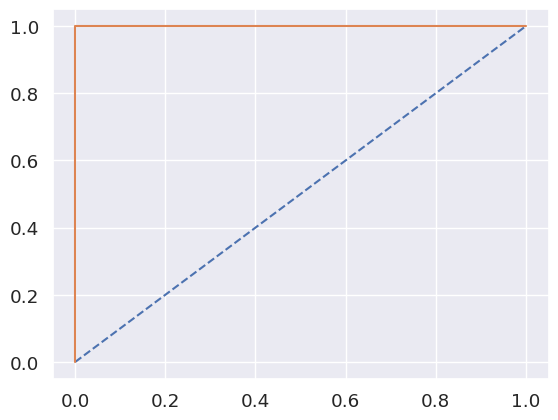

In [114]:
# predict probabilities
probs = RF_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr)

AUC: 1.000


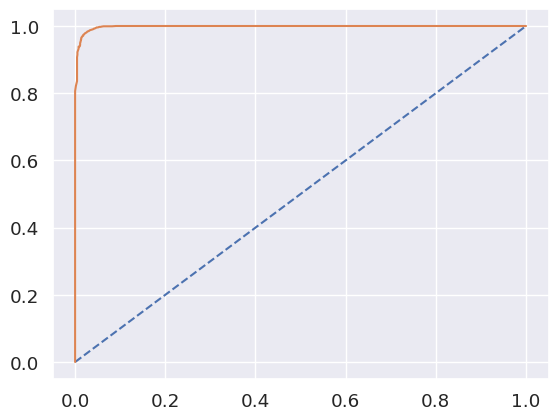

In [115]:
# predict probabilities
probs = RF_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr)

##XGBoost

In [116]:
import xgboost as xgb
XGB_model=xgb.XGBClassifier(random_state=1,learning_rate=0.01)
XGB_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=1, ...)

0.9125729745123167
              precision    recall  f1-score   support

           0       0.91      0.92      0.91      3512
           1       0.92      0.90      0.91      3511

    accuracy                           0.91      7023
   macro avg       0.91      0.91      0.91      7023
weighted avg       0.91      0.91      0.91      7023

Confusion Matrix


<Axes: >

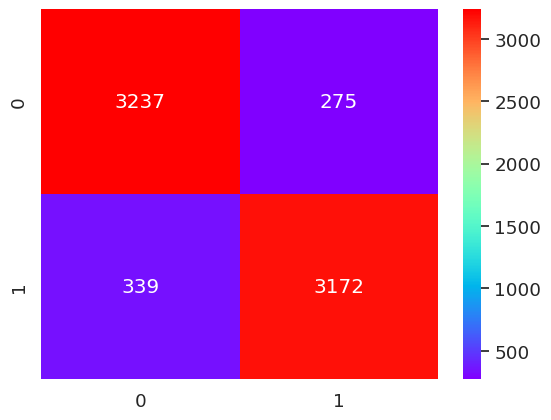

In [117]:
## Performance Matrix on train data set
y_train_predict = XGB_model.predict(X_train)
model_score = XGB_model.score(X_train, y_train)
print(model_score)
print(metrics.classification_report(y_train, y_train_predict))
#confusion matrix training Data
cm_train_knn = confusion_matrix(y_train, y_train_predict)
print('Confusion Matrix')
sns.set(font_scale = 1.2)
sns.heatmap(cm_train_knn, annot = True,fmt = 'd', cmap='rainbow')

0.905595899188381
              precision    recall  f1-score   support

           0       0.90      0.91      0.91      1170
           1       0.91      0.90      0.91      1171

    accuracy                           0.91      2341
   macro avg       0.91      0.91      0.91      2341
weighted avg       0.91      0.91      0.91      2341

Confusion Matrix


<Axes: >

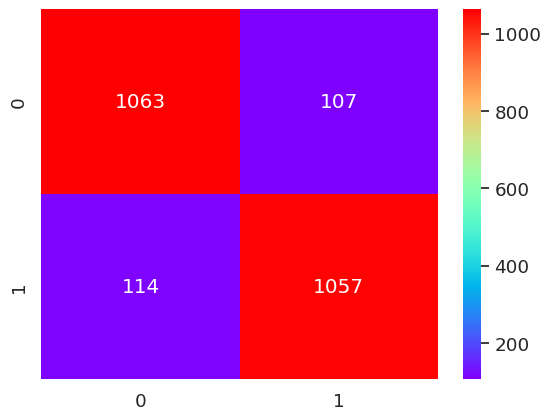

In [118]:
## Performance Matrix on test data set
y_test_predict = XGB_model.predict(X_test)
model_score = XGB_model.score(X_test, y_test)
print(model_score)
print(metrics.classification_report(y_test, y_test_predict))
#confusion matrix test Data
cm_test_knn = confusion_matrix(y_test, y_test_predict)
sns.set(font_scale = 1.2)
print('Confusion Matrix')
sns.heatmap(cm_test_knn, annot = True,fmt = 'd', cmap='rainbow')

AUC: 0.976


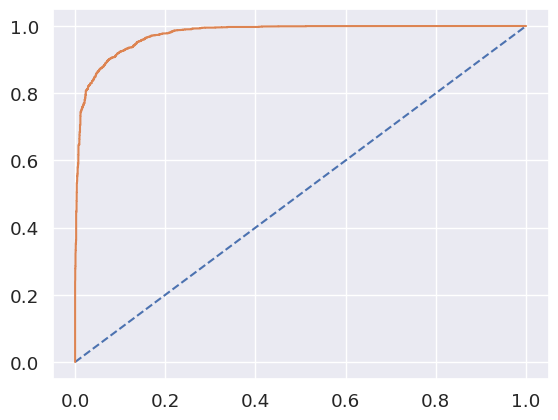

In [119]:
# predict probabilities
probs = XGB_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr)


AUC: 0.976


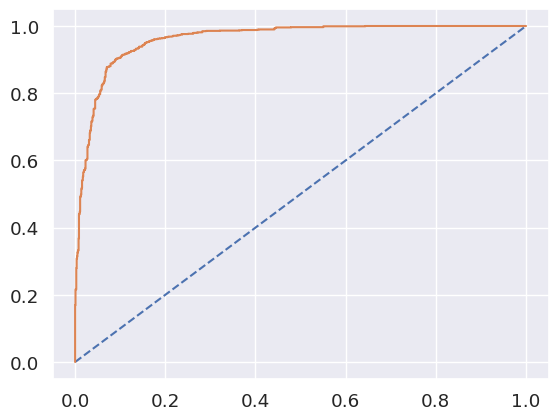

In [120]:
# predict probabilities
probs = XGB_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr)